### Подключение доступа к файлам данных для гугл драйв

In [32]:
from google.colab import drive
drive.mount('/content/drive/')

Drive already mounted at /content/drive/; to attempt to forcibly remount, call drive.mount("/content/drive/", force_remount=True).


### Импорт библиотек

In [33]:
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns
import math

from sklearn import preprocessing
from sklearn.preprocessing import MinMaxScaler
from sklearn.compose import ColumnTransformer

from sklearn.model_selection import train_test_split
from sklearn.model_selection import KFold
from sklearn.model_selection import cross_val_score, cross_validate
from sklearn.model_selection import GridSearchCV

from sklearn.base import BaseEstimator
from sklearn.linear_model import LinearRegression
from sklearn.linear_model import Ridge
from sklearn.linear_model import Lasso
from sklearn.svm import SVR
from sklearn.neighbors import KNeighborsRegressor
from sklearn.tree import DecisionTreeRegressor
from sklearn.ensemble import RandomForestRegressor
from sklearn.ensemble import GradientBoostingRegressor
from sklearn import metrics
from sklearn.metrics import r2_score, mean_absolute_error, mean_squared_error
import pickle

### Загрузка исходных данных из файла X_bp и X_nup (параметром index_col исключаем создание дополнительного столбца в качестве индексного:)

In [34]:
X_bp = pd.read_excel('/content/drive/MyDrive/Data Science/VKR/DataSet/X_bp.xlsx', index_col=0)
X_nup = pd.read_excel('/content/drive/MyDrive/Data Science/VKR/DataSet/X_nup.xlsx', index_col=0)

In [35]:
X_bp.shape

(1023, 10)

In [36]:
X_nup.shape

(1040, 3)

Датасет X_bp имеет 1023 строки записей, датасет X_nup - 1040 строк. Поскольку X_bp имеет больше данных (столбцов), пытаться заполнить/предсказать пропуски при объединении бессмысленно, кроме прочего 15 строк это не более 1,5% всех данных. Таким образом, пренебрегаем "лишними" строками второго датасета, объединенный датасет будет иметь 1023 строки.

###  Объединение датасетов
####  Объединение по индексу, тип объединения INNER

In [37]:
X_join = X_bp.join(X_nup, how='inner')

In [38]:
X_join.shape

(1023, 13)

Просмотр объединенного датасета

In [39]:
X_join.head(5)

,Соотношение матрица-наполнитель,"Плотность, кг/м3","модуль упругости, ГПа","Количество отвердителя, м.%","Содержание эпоксидных групп,%_2","Температура вспышки, С_2","Поверхностная плотность, г/м2","Модуль упругости при растяжении, ГПа","Прочность при растяжении, МПа","Потребление смолы, г/м2","Угол нашивки, град",Шаг нашивки,Плотность нашивки
0,1.857143,2030.0,738.736842,30.00,22.267857,100.000000,210.0,70.0,3000.0,220.0,0,4.0,57.0
1,1.857143,2030.0,738.736842,50.00,23.750000,284.615385,210.0,70.0,3000.0,220.0,0,4.0,60.0
2,1.857143,2030.0,738.736842,49.90,33.000000,284.615385,210.0,70.0,3000.0,220.0,0,4.0,70.0
3,1.857143,2030.0,738.736842,129.00,21.250000,300.000000,210.0,70.0,3000.0,220.0,0,5.0,47.0
4,2.771331,2030.0,753.000000,111.86,22.267857,284.615385,210.0,70.0,3000.0,220.0,0,5.0,57.0


Список признаков

In [40]:
pd.DataFrame(X_join.columns, columns=['Признаки'])

,Признаки
0,Соотношение матрица-наполнитель
1,"Плотность, кг/м3"
2,"модуль упругости, ГПа"
3,"Количество отвердителя, м.%"
4,"Содержание эпоксидных групп,%_2"
5,"Температура вспышки, С_2"
6,"Поверхностная плотность, г/м2"
7,"Модуль упругости при растяжении, ГПа"
8,"Прочность при растяжении, МПа"
9,"Потребление смолы, г/м2"


Информация о датасете, проверка типа данных в каждом столбце (типа признаков)

In [41]:
X_join.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 1023 entries, 0 to 1022
Data columns (total 13 columns):
 #   Column                                Non-Null Count  Dtype  
---  ------                                --------------  -----  
 0   Соотношение матрица-наполнитель       1023 non-null   float64
 1   Плотность, кг/м3                      1023 non-null   float64
 2   модуль упругости, ГПа                 1023 non-null   float64
 3   Количество отвердителя, м.%           1023 non-null   float64
 4   Содержание эпоксидных групп,%_2       1023 non-null   float64
 5   Температура вспышки, С_2              1023 non-null   float64
 6   Поверхностная плотность, г/м2         1023 non-null   float64
 7   Модуль упругости при растяжении, ГПа  1023 non-null   float64
 8   Прочность при растяжении, МПа         1023 non-null   float64
 9   Потребление смолы, г/м2               1023 non-null   float64
 10  Угол нашивки, град                    1023 non-null   int64  
 11  Шаг нашивки      

Все переменные содержат значения float64, кроме 'Угол нашивки, град', поэтому нужно конвертировать int64 в float64.

In [42]:
X_join['Угол нашивки, град'] = X_join['Угол нашивки, град'].astype(float)
print(X_join.dtypes)

Соотношение матрица-наполнитель         float64
Плотность, кг/м3                        float64
модуль упругости, ГПа                   float64
Количество отвердителя, м.%             float64
Содержание эпоксидных групп,%_2         float64
Температура вспышки, С_2                float64
Поверхностная плотность, г/м2           float64
Модуль упругости при растяжении, ГПа    float64
Прочность при растяжении, МПа           float64
Потребление смолы, г/м2                 float64
Угол нашивки, град                      float64
Шаг нашивки                             float64
Плотность нашивки                       float64
dtype: object


## Разведочный анализ данных

Проверка на пропуски

In [43]:
X_join.isnull().sum()

Соотношение матрица-наполнитель         0
Плотность, кг/м3                        0
модуль упругости, ГПа                   0
Количество отвердителя, м.%             0
Содержание эпоксидных групп,%_2         0
Температура вспышки, С_2                0
Поверхностная плотность, г/м2           0
Модуль упругости при растяжении, ГПа    0
Прочность при растяжении, МПа           0
Потребление смолы, г/м2                 0
Угол нашивки, град                      0
Шаг нашивки                             0
Плотность нашивки                       0
dtype: int64

Пропусков в датасете нет, что может говорить о том, что датасет уже обрабатывался

Количество уникальных значений в каждом столбце

In [44]:
X_join.nunique()

Соотношение матрица-наполнитель         1014
Плотность, кг/м3                        1013
модуль упругости, ГПа                   1020
Количество отвердителя, м.%             1005
Содержание эпоксидных групп,%_2         1004
Температура вспышки, С_2                1003
Поверхностная плотность, г/м2           1004
Модуль упругости при растяжении, ГПа    1004
Прочность при растяжении, МПа           1004
Потребление смолы, г/м2                 1003
Угол нашивки, град                         2
Шаг нашивки                              989
Плотность нашивки                        988
dtype: int64

Общее количество строк в датасете 1023, при этом колическво уникальных значений варьируется от 988 до 1014 (столбец "Угол нашивки, град" не рассматриваем).

Т.к. данные являются результатом экспериментальных измерений, такое количество уникальных значений кажется странным.

Рассмотрим данные в столбцах более подробно.

Отрисовка графиков данных из столбцов

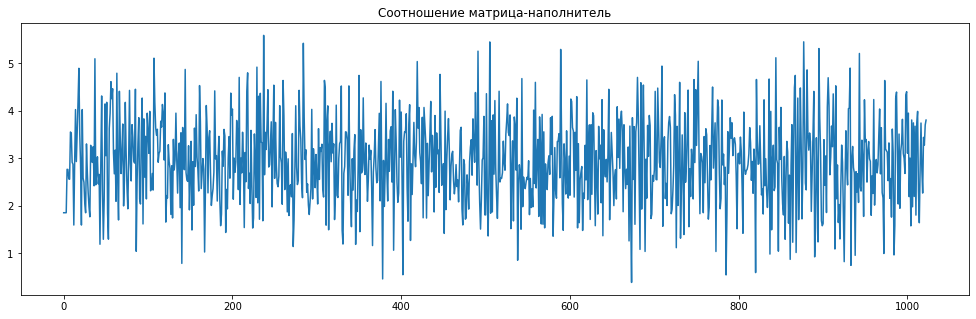

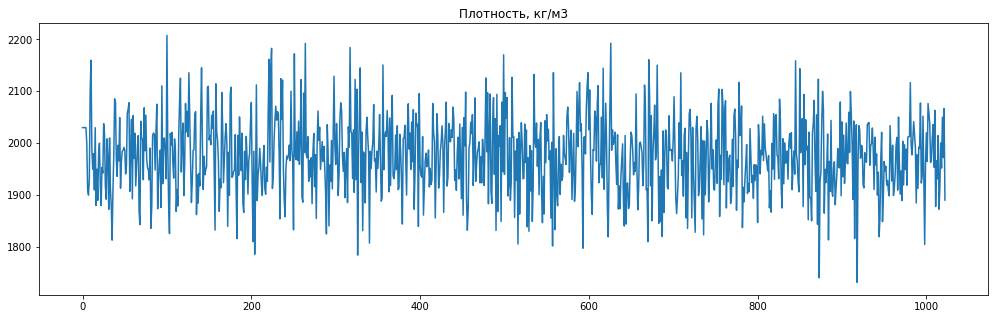

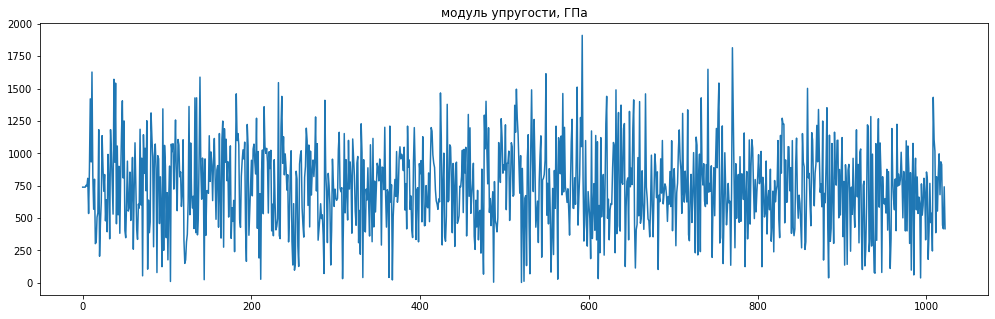

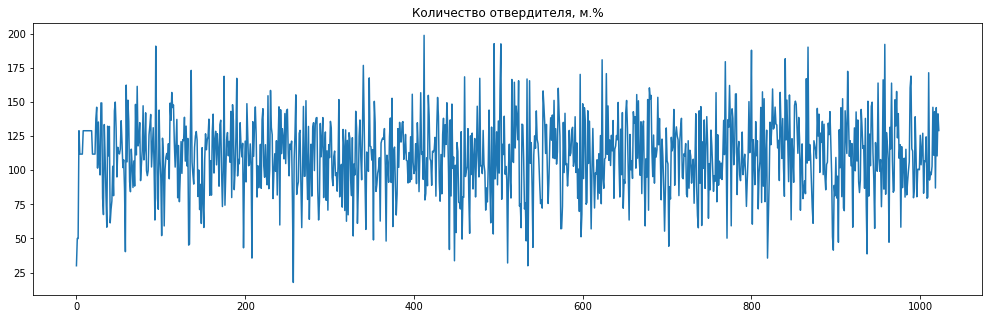

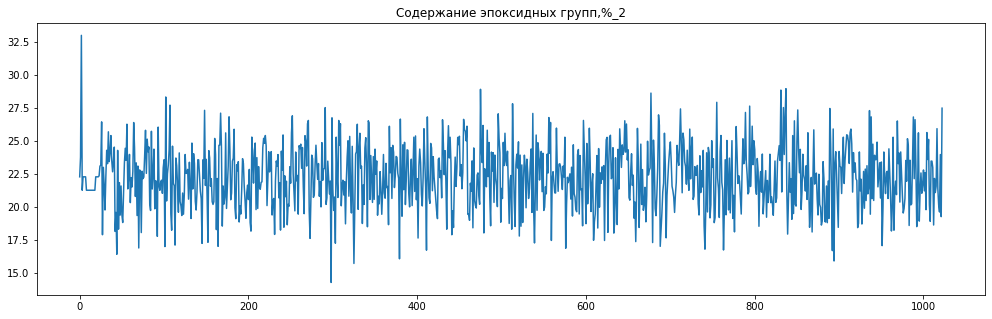

...

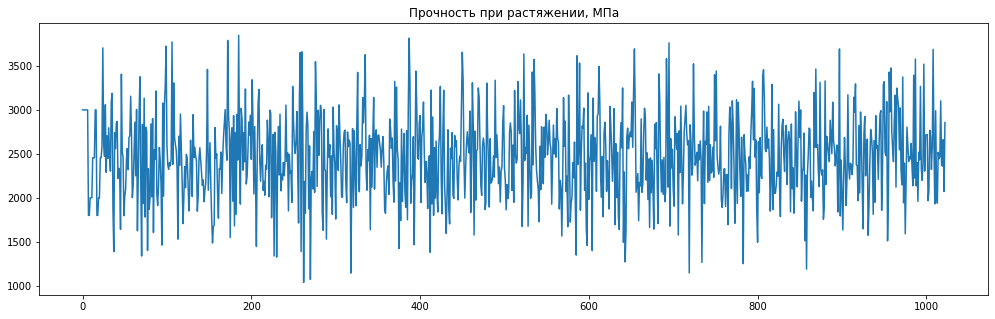

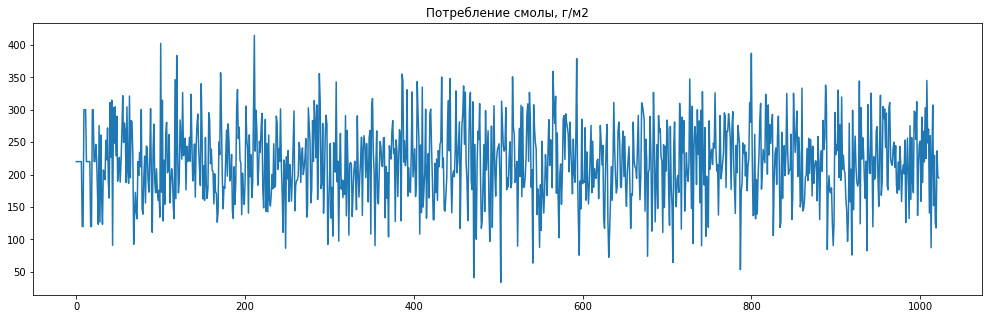

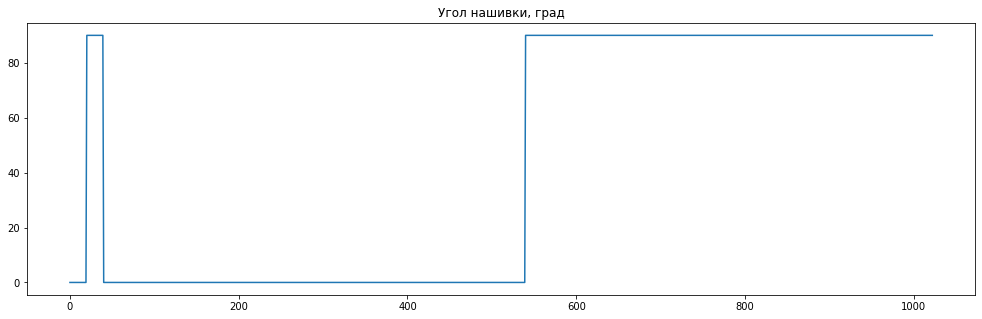

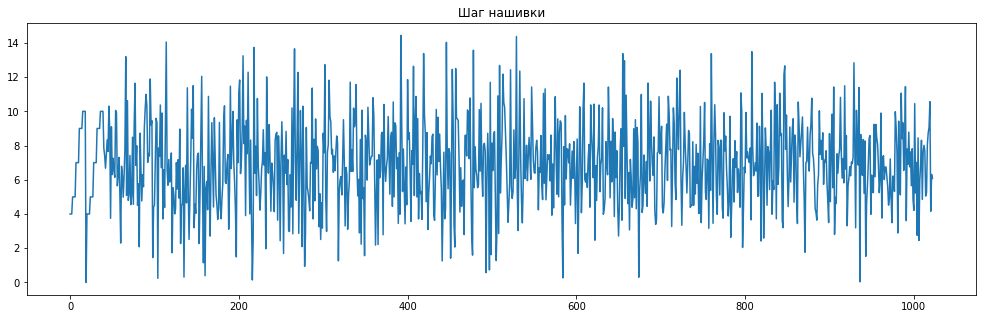

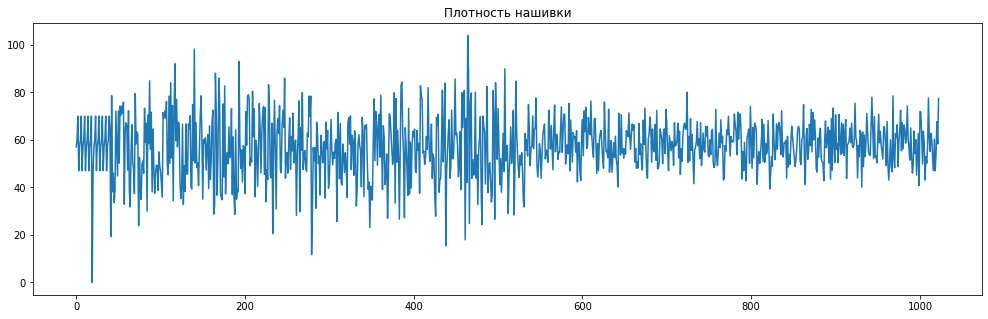

In [45]:
for column in X_join:
    plt.figure(column, figsize = (17, 5))
    plt.title(column)
    X_join[column].plot.line()

Из графиков видно, что начальные значения в данных либо являются ошибками, либо искусственные. Чтобы они не влияли на моделирование необходимо их удалить( 40 строк). 

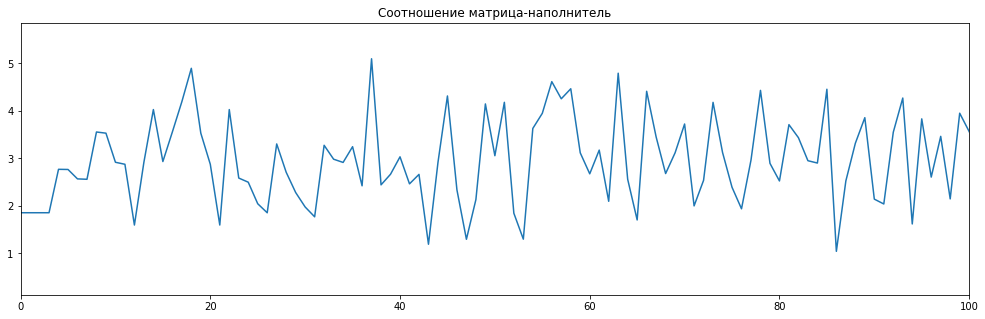

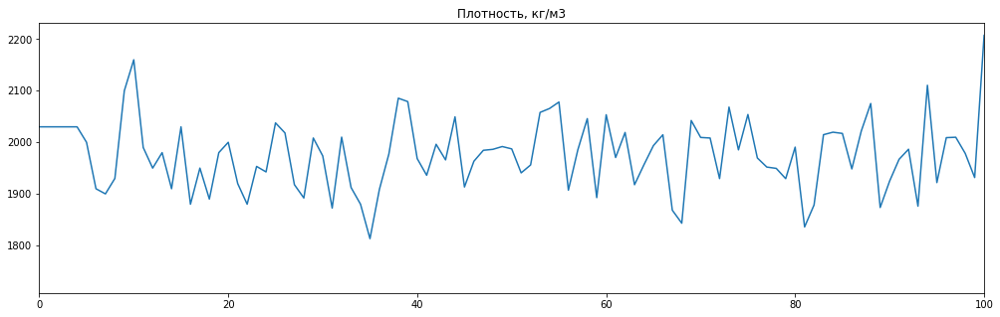

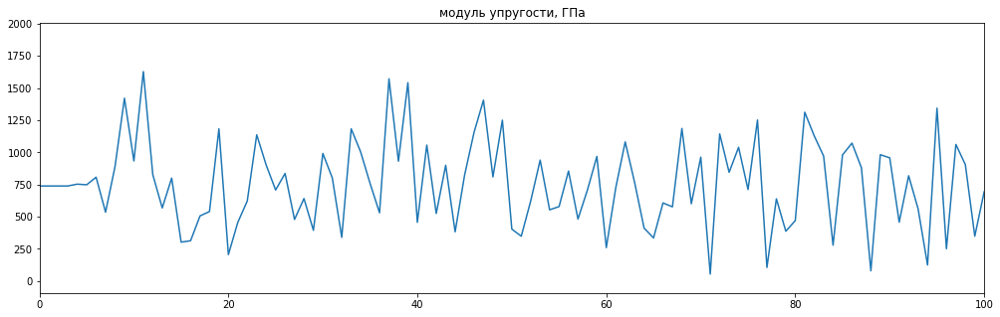

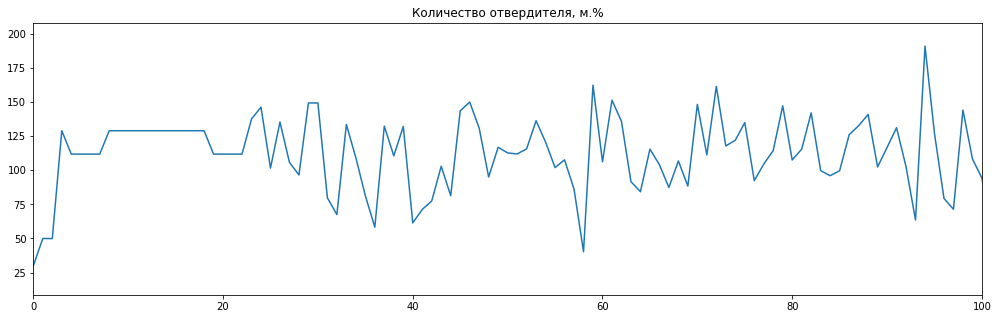

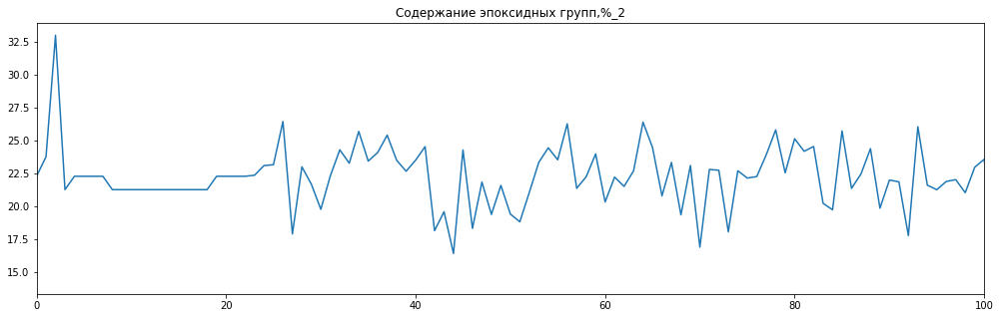

...

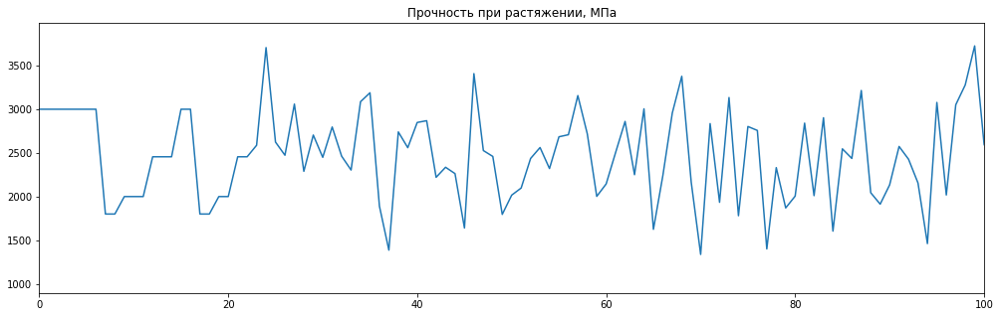

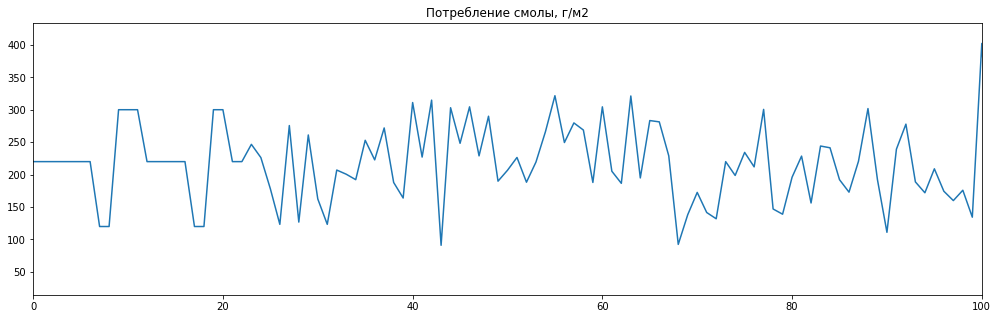

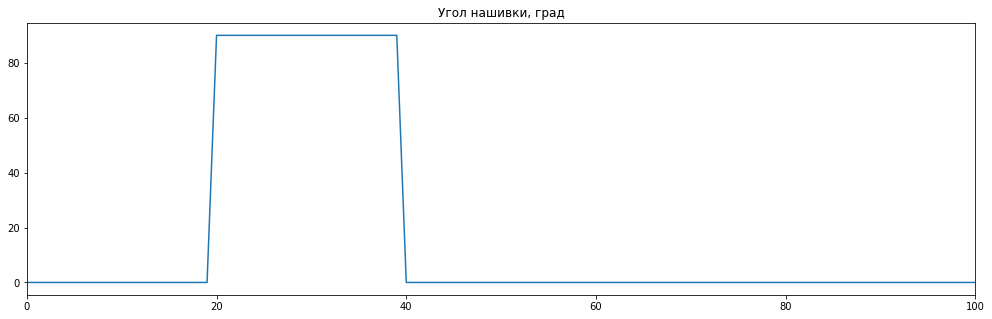

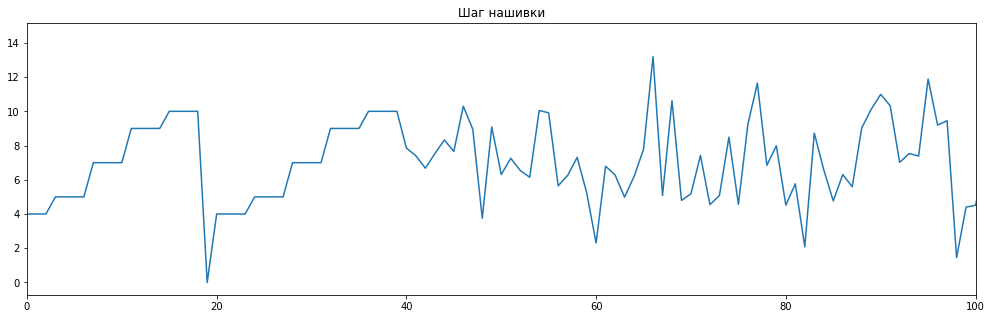

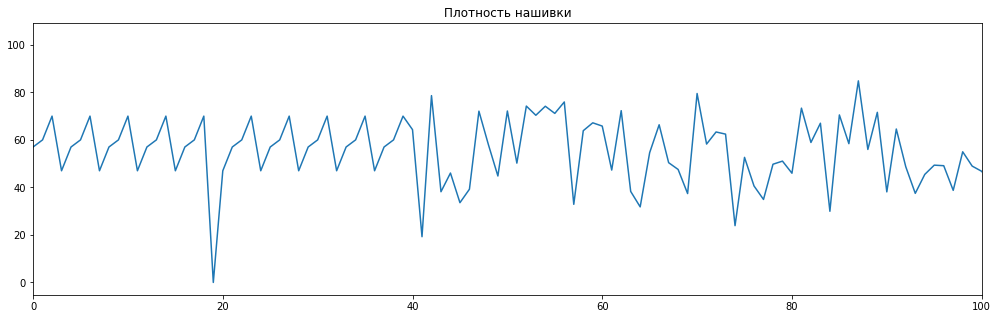

In [46]:
for column in X_join:
    plt.figure(column, figsize = (17, 5))
    plt.xlim(0, 100)
    plt.title(column)
    X_join[column].plot.line()

Удаление первых 40 строк

In [47]:
X_new = X_join[X_join.index > 40].reset_index(drop=True)
X_new.head()

,Соотношение матрица-наполнитель,"Плотность, кг/м3","модуль упругости, ГПа","Количество отвердителя, м.%","Содержание эпоксидных групп,%_2","Температура вспышки, С_2","Поверхностная плотность, г/м2","Модуль упругости при растяжении, ГПа","Прочность при растяжении, МПа","Потребление смолы, г/м2","Угол нашивки, град",Шаг нашивки,Плотность нашивки
0,2.465205,1936.099137,1056.554985,71.294058,24.523381,271.975678,129.077163,66.420794,2868.586527,227.022557,0.0,7.401543,19.250533
1,2.664389,1996.159145,525.057774,77.506883,18.126107,223.408685,28.658102,69.489773,2220.587445,314.776669,0.0,6.675780,78.623299
2,1.193530,1965.929227,899.603701,102.959069,19.566716,225.810223,871.088955,73.454695,2335.541792,91.047646,0.0,7.526398,38.176975
3,2.914333,2049.373404,382.263359,81.352047,16.391595,233.296063,561.992131,69.814615,2262.784366,303.075452,0.0,8.325699,46.045428
4,4.315666,1913.379677,822.918735,143.576937,24.275588,274.988794,260.859341,75.957329,1639.912525,248.244330,0.0,7.656211,33.571024


In [48]:
X_new.shape

(982, 13)

In [49]:
X_new.nunique()

Соотношение матрица-наполнитель         982
Плотность, кг/м3                        982
модуль упругости, ГПа                   982
Количество отвердителя, м.%             982
Содержание эпоксидных групп,%_2         982
Температура вспышки, С_2                982
Поверхностная плотность, г/м2           982
Модуль упругости при растяжении, ГПа    982
Прочность при растяжении, МПа           982
Потребление смолы, г/м2                 982
Угол нашивки, град                        2
Шаг нашивки                             982
Плотность нашивки                       982
dtype: int64

Описательная статистика наших данных (максимальное, минимальное, квартили, медиана, стандартное отклонение, среднее значение и т.д.).


In [50]:
X_join.describe().T

,count,mean,std,min,25%,50%,75%,max
Соотношение матрица-наполнитель,1023.0,2.930366,0.913222,0.389403,2.317887,2.906878,3.552660,5.591742
"Плотность, кг/м3",1023.0,1975.734888,73.729231,1731.764635,1924.155467,1977.621657,2021.374375,2207.773481
"модуль упругости, ГПа",1023.0,739.923233,330.231581,2.436909,500.047452,739.664328,961.812526,1911.536477
"Количество отвердителя, м.%",1023.0,110.570769,28.295911,17.740275,92.443497,110.564840,129.730366,198.953207
"Содержание эпоксидных групп,%_2",1023.0,22.244390,2.406301,14.254985,20.608034,22.230744,23.961934,33.000000
"Температура вспышки, С_2",1023.0,285.882151,40.943260,100.000000,259.066528,285.896812,313.002106,413.273418
"Поверхностная плотность, г/м2",1023.0,482.731833,281.314690,0.603740,266.816645,451.864365,693.225017,1399.542362
"Модуль упругости при растяжении, ГПа",1023.0,73.328571,3.118983,64.054061,71.245018,73.268805,75.356612,82.682051
"Прочность при растяжении, МПа",1023.0,2466.922843,485.628006,1036.856605,2135.850448,2459.524526,2767.193119,3848.436732
"Потребление смолы, г/м2",1023.0,218.423144,59.735931,33.803026,179.627520,219.198882,257.481724,414.590628


## Корреляция признаков

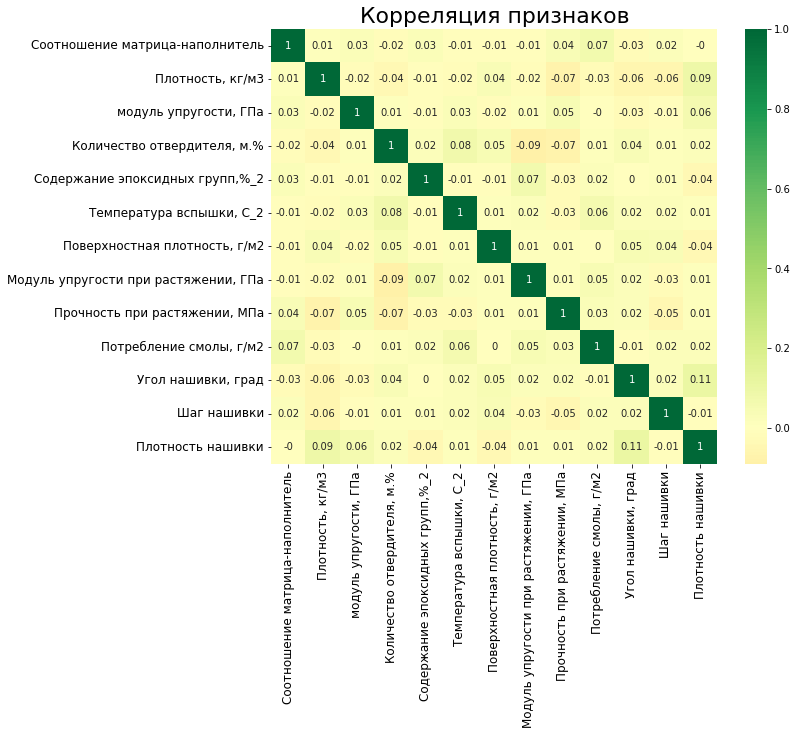

In [51]:
plt.figure(figsize=(10,8))
sns.heatmap(X_new.corr().round(2), xticklabels=X_new.corr().columns, yticklabels=X_new.corr().columns, cmap='RdYlGn', center=0, annot=True)
plt.title('Корреляция признаков', fontsize=22)
plt.xticks(fontsize=12)
plt.yticks(fontsize=12)
plt.show()

Гистограммы распределения каждой из переменной

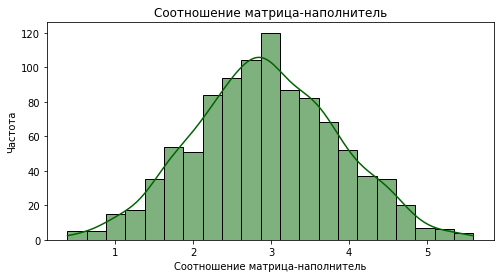

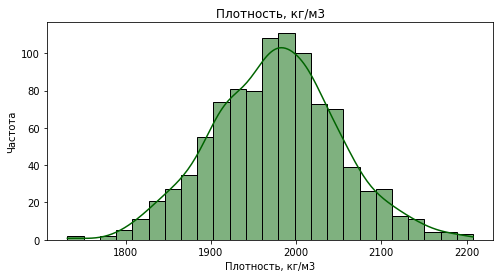

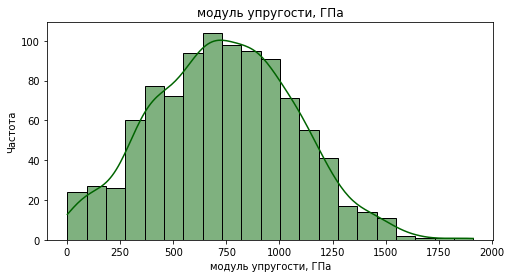

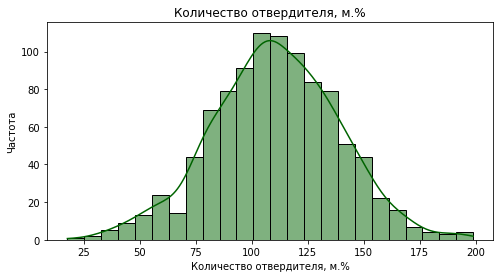

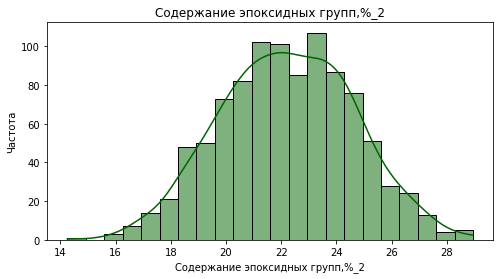

...

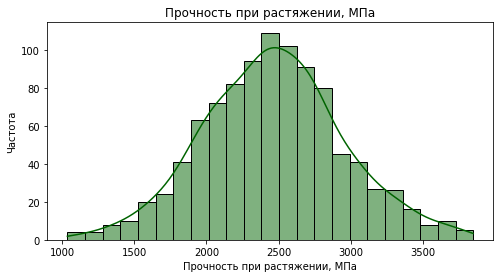

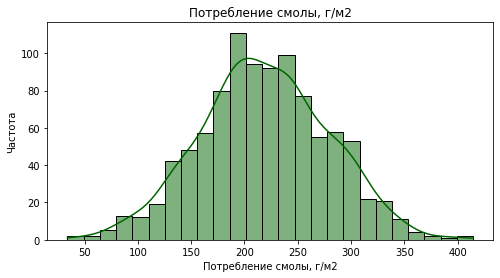

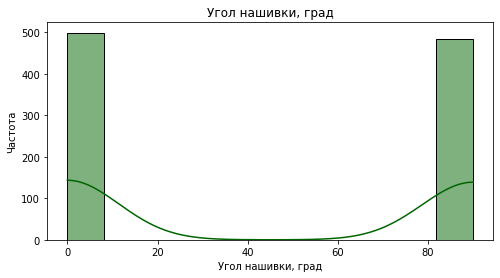

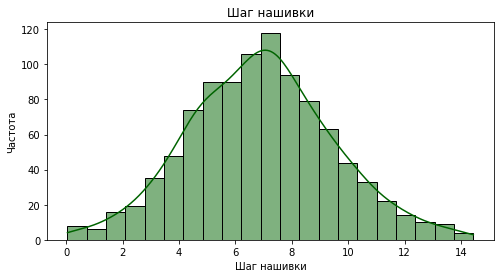

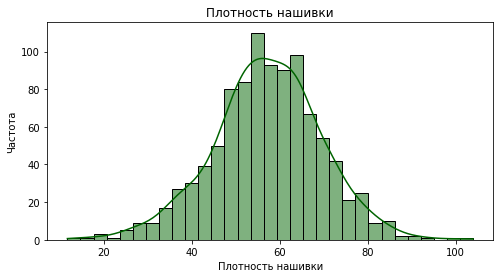

In [52]:
for col in X_new.columns:
    plt.figure(figsize = (8, 4))
    plt.title(col)
    plt.ylabel('Частота')
    sns.histplot(data = X_new[col], color = 'darkgreen', kde = True)
    plt.show()

Диаграммы ящика с усами

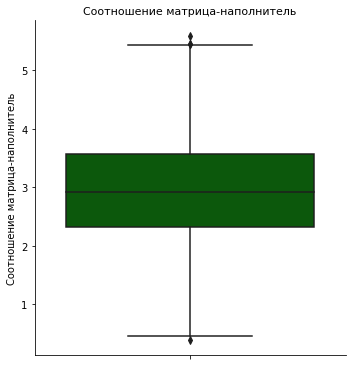

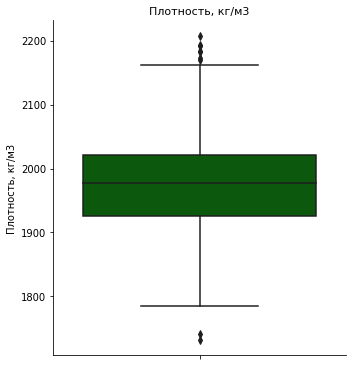

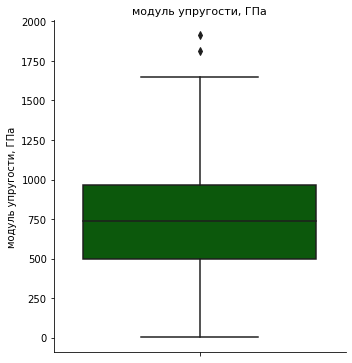

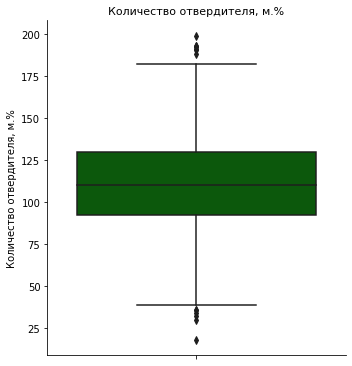

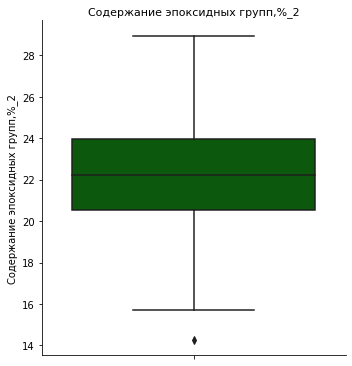

...

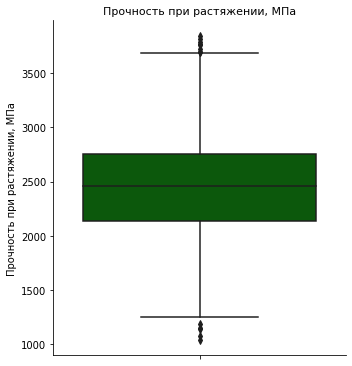

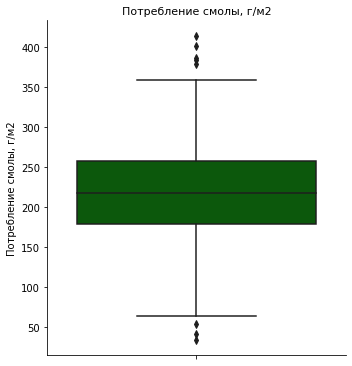

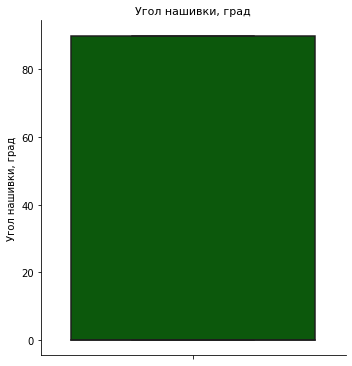

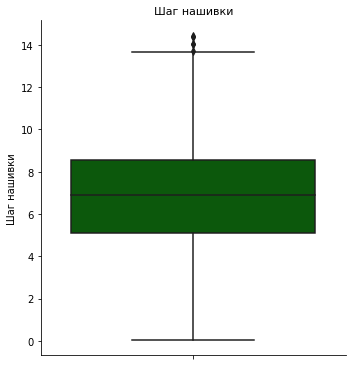

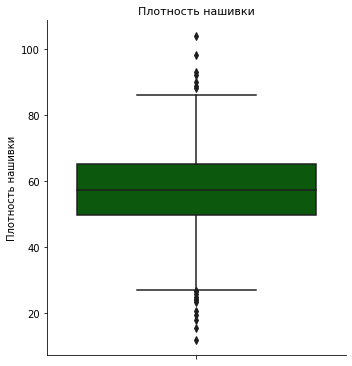

In [53]:
for col in X_new.columns: 
    sns.catplot(y = col, data = X_new, kind = 'box', color = 'darkgreen')
    plt.title(col, fontsize = 11)

Попарные графики рассеяния точек

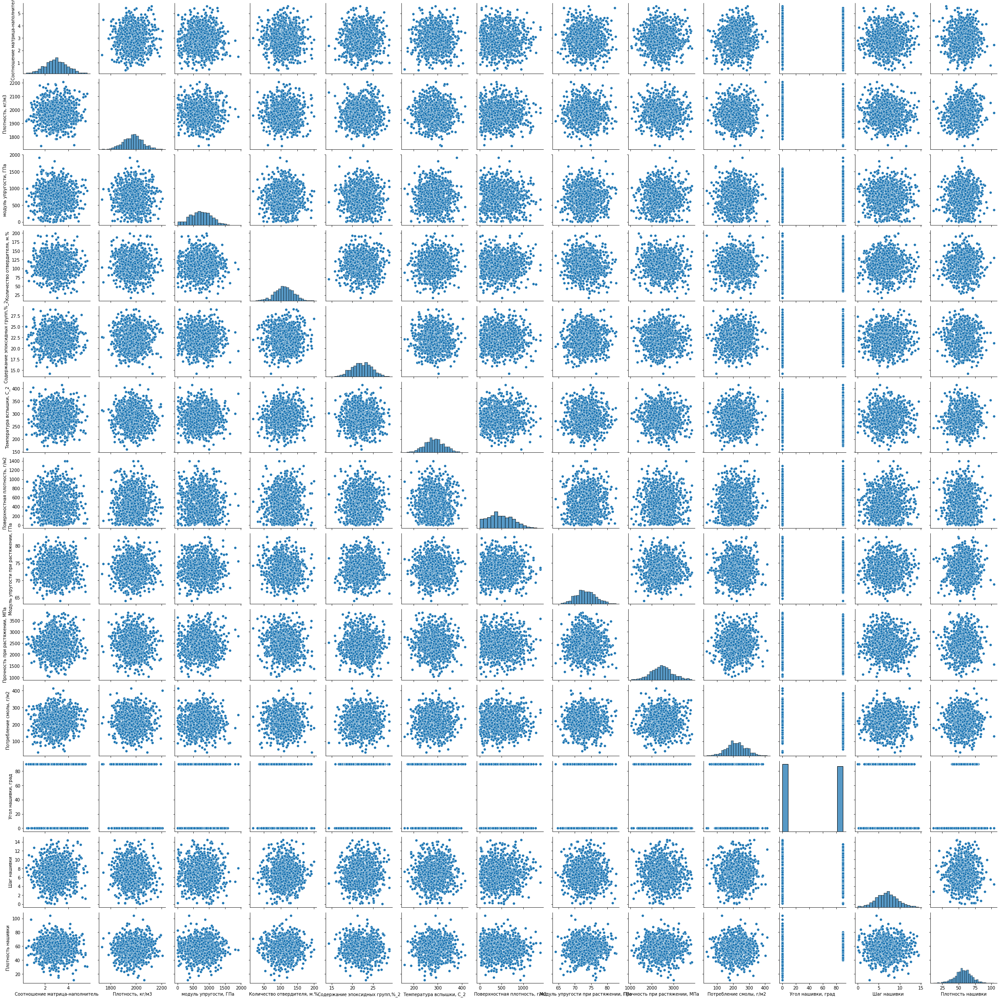

In [54]:
# Построю попарные графики рассеяния 
sns.pairplot(X_new, diag_kind = 'hist', kind = 'scatter')

На основе анализа гистограмм распределения, "ящиков с усами" и сопоставления средних и медианных значений можно сделать вывод, что все параметры, кроме показателя "Угол нашивки" имеют распределение, близкое к нормальному. При этом присутствуют выбросы в каждом столбце, кроме параметра "Угол нашивки".

## Предобработка данных

### Определение и удаление выбрасов

In [55]:
# Метод межквартильных расстояний 
# Замена выбросов на пустые значения
for i in X_new.columns:
    q75, q25 = np.percentile(X_new.loc[:,i], [75,25])
    intr_qr = q75 - q25
    max = q75 + (1.5 * intr_qr)
    min = q25 - (1.5 * intr_qr)
    X_new.loc[X_new[i] < min, i] = np.nan
    X_new.loc[X_new[i] > max, i] = np.nan

In [56]:
X_new.isnull().sum()

Соотношение матрица-наполнитель          4
Плотность, кг/м3                         9
модуль упругости, ГПа                    2
Количество отвердителя, м.%             13
Содержание эпоксидных групп,%_2          1
Температура вспышки, С_2                 7
Поверхностная плотность, г/м2            2
Модуль упругости при растяжении, ГПа     6
Прочность при растяжении, МПа           13
Потребление смолы, г/м2                  8
Угол нашивки, град                       0
Шаг нашивки                              5
Плотность нашивки                       19
dtype: int64

In [57]:
X_new.dropna(inplace = True) # удаление пустых значений

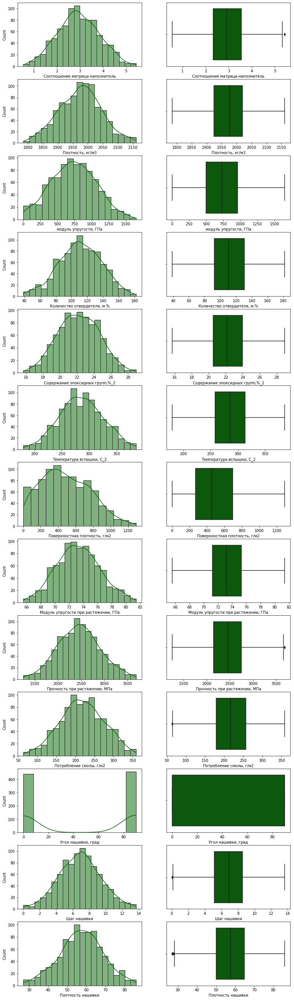

In [58]:
# Графики распределения переменных и "ящики с усами"
fig, axes = plt.subplots(13, 2, figsize=(13, 48))
for k, column in enumerate(X_new.columns):    
    sns.histplot(data=X_new, x=column, kde=True, ax=axes[k, 0], color = 'darkgreen')
    sns.boxplot(data=X_new, x=column, ax=axes[k, 1], color = 'darkgreen')
plt.show()

По графиком видно, что удалились не все выбросы.

Проведем удаление выбросов еще раз

In [59]:
for i in X_new.columns:
    q75, q25 = np.percentile(X_new.loc[:,i], [75,25])
    intr_qr = q75 - q25
    max = q75 + (1.5 * intr_qr)
    min = q25 - (1.5 * intr_qr)
    X_new.loc[X_new[i] < min, i] = np.nan
    X_new.loc[X_new[i] > max, i] = np.nan

In [60]:
X_new.isnull().sum()

Соотношение матрица-наполнитель         1
Плотность, кг/м3                        0
модуль упругости, ГПа                   0
Количество отвердителя, м.%             0
Содержание эпоксидных групп,%_2         0
Температура вспышки, С_2                0
Поверхностная плотность, г/м2           0
Модуль упругости при растяжении, ГПа    0
Прочность при растяжении, МПа           1
Потребление смолы, г/м2                 1
Угол нашивки, град                      0
Шаг нашивки                             1
Плотность нашивки                       3
dtype: int64

In [61]:
X_new.dropna(inplace = True) # удаление пустых значений

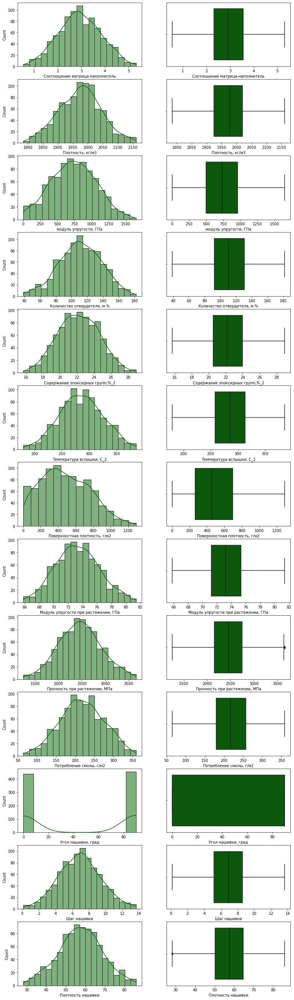

In [62]:
# Графики распределения переменных и "ящики с усами"
fig, axes = plt.subplots(13, 2, figsize=(13, 48))
for k, column in enumerate(X_new.columns):    
    sns.histplot(data=X_new, x=column, kde=True, ax=axes[k, 0], color = 'darkgreen')
    sns.boxplot(data=X_new, x=column, ax=axes[k, 1], color = 'darkgreen')
plt.show()

Корреляция признаков  после удаления выбросов

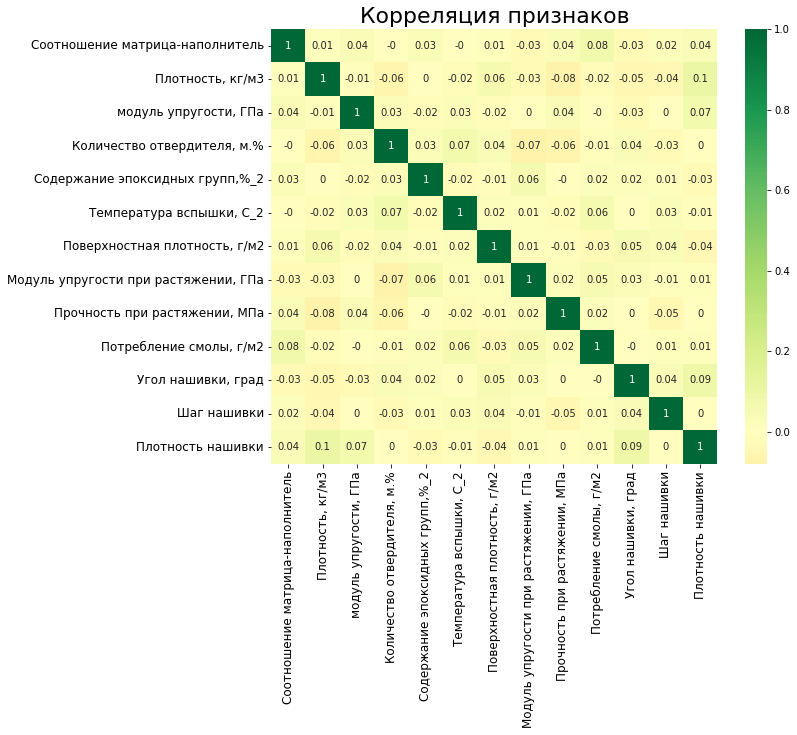

In [63]:
plt.figure(figsize=(10,8))
sns.heatmap(X_new.corr().round(2), xticklabels=X_new.corr().columns, yticklabels=X_new.corr().columns, cmap='RdYlGn', center=0, annot=True)
plt.title('Корреляция признаков', fontsize=22)
plt.xticks(fontsize=12)
plt.yticks(fontsize=12)
plt.show()

По результатам построения тепловой карты видим, что даже после удаления выбросов коэффициент корреляции все еще очень низкий. Это в свою очередь говорит о слабой взаимосвязи между параметрами.

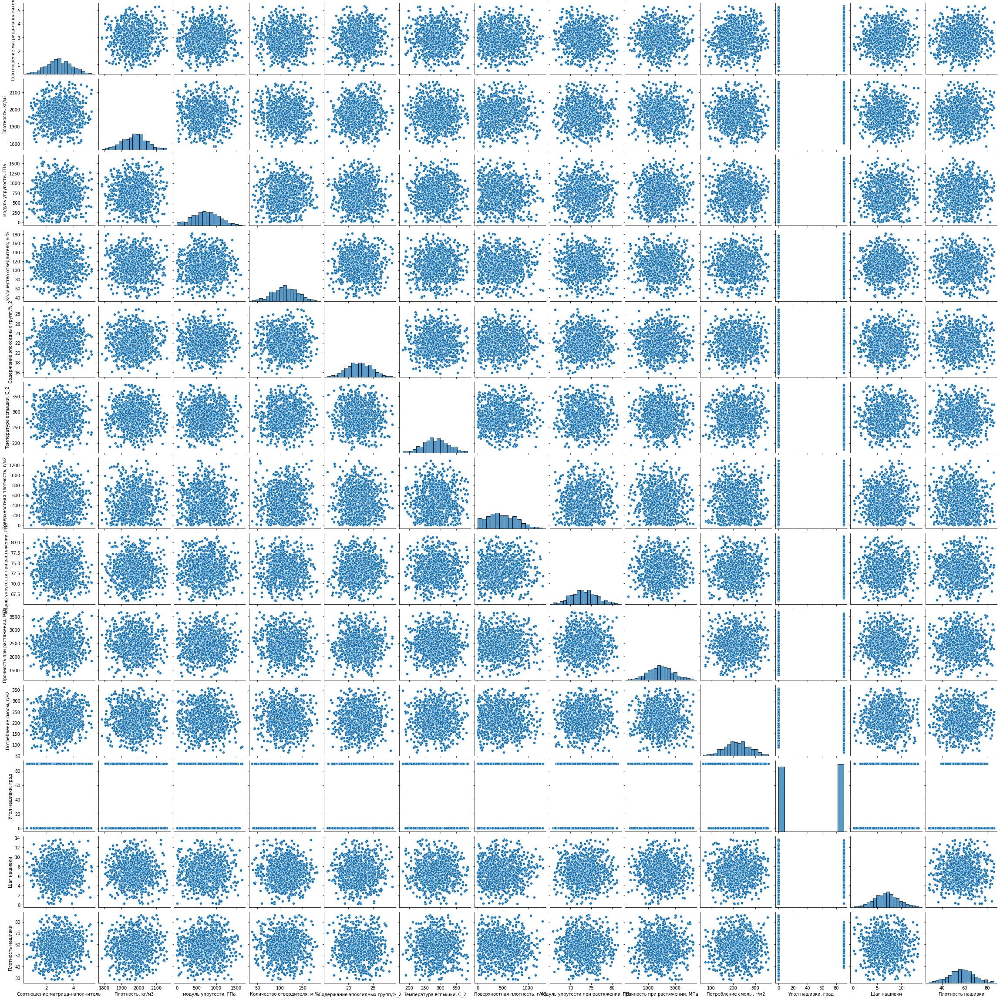

In [64]:
# Построю попарные графики рассеяния 
sns.pairplot(X_new, diag_kind = 'hist', kind = 'scatter')

In [65]:
X_new.describe().T

,count,mean,std,min,25%,50%,75%,max
Соотношение матрица-наполнитель,890.0,2.928925,0.896982,0.547391,2.320191,2.908811,3.551339,5.314144
"Плотность, кг/м3",890.0,1974.340221,70.869622,1784.482245,1923.887189,1977.603973,2020.082671,2161.565216
"модуль упругости, ГПа",890.0,735.880602,327.653047,2.436909,498.275517,733.016158,960.465724,1649.415706
"Количество отвердителя, м.%",890.0,111.010058,26.973789,38.668500,92.497018,110.573604,130.404874,181.828448
"Содержание эпоксидных групп,%_2",890.0,22.187011,2.418853,15.695894,20.521955,22.146953,23.966198,28.955094
"Температура вспышки, С_2",890.0,285.664458,39.879163,179.374391,258.386295,285.853960,313.040444,386.067992
"Поверхностная плотность, г/м2",890.0,482.105364,280.915278,0.603740,265.027350,452.891920,696.248199,1291.340115
"Модуль упругости при растяжении, ГПа",890.0,73.302274,3.039914,65.793845,71.241213,73.184259,75.322715,81.417126
"Прочность при растяжении, МПа",890.0,2463.507094,457.353044,1250.392802,2150.188224,2456.394188,2751.499231,3660.450210
"Потребление смолы, г/м2",890.0,218.010506,57.575275,64.524180,179.719792,216.779521,256.995883,359.052220


### Нормализация данных

Нормальзуем значения с помощью метода MinMaxScaler

<Axes: ylabel='Density'>

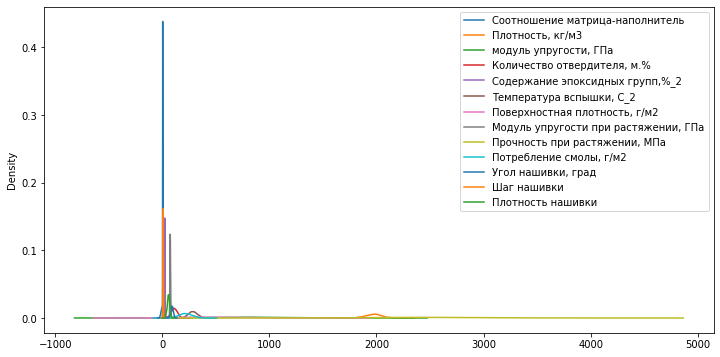

In [66]:
# График разброса до нормализации
fig, ax = plt.subplots(figsize=(12,6))
X_new.plot(kind = 'kde', ax = ax)

In [67]:
min_max_scaler = MinMaxScaler()
X_norm = pd.DataFrame(min_max_scaler.fit_transform(X_new), columns = X_new.columns, index = X_new.index)

Построение графика разброса данных после нормализации

<Axes: ylabel='Density'>

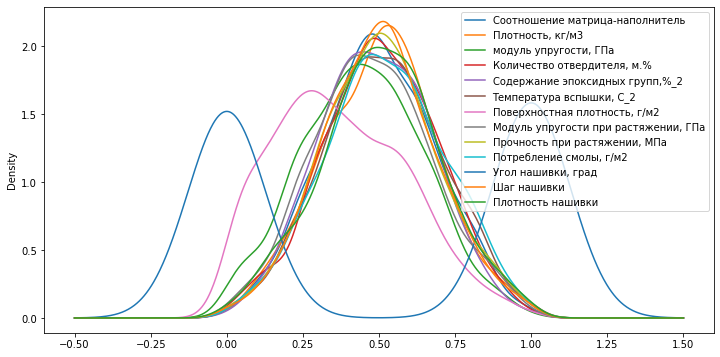

In [68]:
fig, ax = plt.subplots(figsize=(12,6))
X_norm.plot(kind = 'kde', ax = ax)

Описательная статистика для нормализованного датасета

In [69]:
X_norm.describe().T

,count,mean,std,min,25%,50%,75%,max
Соотношение матрица-наполнитель,890.0,0.499613,0.188175,0.0,0.371909,0.495394,0.630187,1.0
"Плотность, кг/м3",890.0,0.503491,0.187942,0.0,0.369693,0.512147,0.624797,1.0
"модуль упругости, ГПа",890.0,0.445327,0.198942,0.0,0.301059,0.443588,0.581689,1.0
"Количество отвердителя, м.%",890.0,0.505320,0.188417,0.0,0.376003,0.502271,0.640796,1.0
"Содержание эпоксидных групп,%_2",890.0,0.489556,0.182428,0.0,0.363978,0.486535,0.623741,1.0
"Температура вспышки, С_2",890.0,0.514240,0.192939,0.0,0.382266,0.515157,0.646687,1.0
"Поверхностная плотность, г/м2",890.0,0.373044,0.217640,0.0,0.204863,0.350411,0.538952,1.0
"Модуль упругости при растяжении, ГПа",890.0,0.480592,0.194576,0.0,0.348670,0.473039,0.609915,1.0
"Прочность при растяжении, МПа",890.0,0.503355,0.189769,0.0,0.373350,0.500404,0.622851,1.0
"Потребление смолы, г/м2",890.0,0.521126,0.195483,0.0,0.391119,0.516947,0.653492,1.0


Корреляция признаков  после нормализации

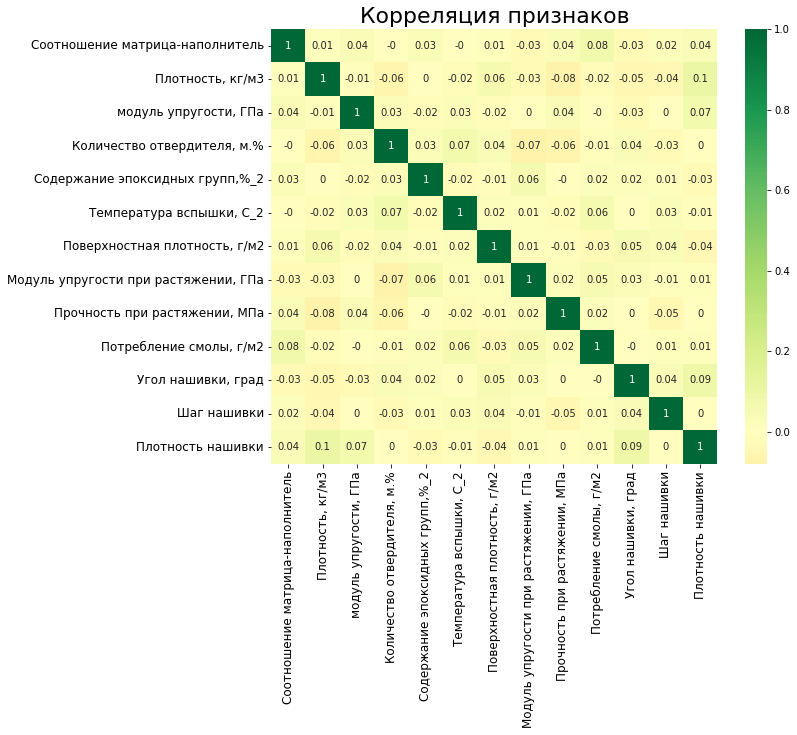

In [70]:
plt.figure(figsize=(10,8))
sns.heatmap(X_norm.corr().round(2), xticklabels=X_norm.corr().columns, yticklabels=X_norm.corr().columns, cmap='RdYlGn', center=0, annot=True)
plt.title('Корреляция признаков', fontsize=22)
plt.xticks(fontsize=12)
plt.yticks(fontsize=12)
plt.show()

## Обучение моделей

### Разделение данных на входные и выходные признаки

In [71]:
y_label = ['Модуль упругости при растяжении, ГПа', 'Прочность при растяжении, МПа', 'Соотношение матрица-наполнитель']
y_norm_n = X_norm[y_label] 
X_norm_n = X_norm.drop(y_label, axis = 1)
y_norm_n.shape,X_norm_n.shape

((890, 3), (890, 10))

In [72]:
y = X_new[y_label] 
X = X_new.drop(y_label, axis = 1)
y.shape,X.shape

((890, 3), (890, 10))

In [73]:
# Препроцессор для задач
preprocessor = ColumnTransformer(transformers=[
        ("continuous", MinMaxScaler(), list(X))
])

### Разделяем датасет на обучающую и тестовую выборки

Выборки для прогноза модуля упругости при растяжении

In [74]:
x_mod_train_, x_mod_test_, y_mod_train, y_mod_test = train_test_split(X, y.iloc[:,0], test_size=0.3, random_state=42)
print('x_train:', x_mod_train_.shape, 'y_train:', y_mod_train.shape)
print('x_test:', x_mod_test_.shape, 'y_test:', y_mod_test.shape)

x_train: (623, 10) y_train: (623,)
x_test: (267, 10) y_test: (267,)


In [75]:
# Выполняю препроцессинг входных переменных
x_mod_train = preprocessor.fit_transform(x_mod_train_)
x_mod_test = preprocessor.transform(x_mod_test_)

Выборки для прогноза прочности при растяжении

In [76]:
x_str_train_, x_str_test_, y_str_train, y_str_test = train_test_split(X, y.iloc[:,1], test_size=0.3, random_state=42)
print('x_train:', x_str_train_.shape, 'y_train:', y_str_train.shape)
print('x_test:', x_str_test_.shape, 'y_test:', y_str_test.shape)

x_train: (623, 10) y_train: (623,)
x_test: (267, 10) y_test: (267,)


In [77]:
# Выполняю препроцессинг входных переменных
x_str_train = preprocessor.fit_transform(x_str_train_)
x_str_test = preprocessor.transform(x_str_test_)

In [78]:
#Выходная переменная преобразованиям не подвергается
y_mod_train = y_mod_train.values
y_mod_test = y_mod_test.values
y_str_train = y_str_train.values
y_str_test = y_str_test.values

# **Модель для модуля упругости при растяжении**

Список моделей:

- LinearRegression
- Ridge
- Lasso
- GradientBoosting
- Random Forest
- DecisionTreeRegressor

In [79]:
# Создадим списки для хранения результатов проверки протестированных моделей
r2_scores = {}
mae_scores = {}
mse_scores = {}

In [80]:
# Создадим список для хранения лучших моделей
model_list = []

### Линейная регрессия

In [81]:
lr = LinearRegression()
lr.fit(x_mod_train, y_mod_train)

y_pred = lr.predict(x_mod_test)

lr_r2 = r2_score(y_mod_test, y_pred)
lr_mae = mean_absolute_error(y_mod_test, y_pred)
lr_mse = mean_squared_error(y_mod_test, y_pred, squared=False)
print("---Linear REGRESSION---")
print("R2 score: "+str(lr_r2))
print("Mean Absolute Error: "+str(lr_mae))
print("Mean Squared Error: "+str(lr_mse))

r2_scores["lr_regression"] = lr_r2
mae_scores["lr_regression"] = lr_mae
mse_scores["lr_regression"] = lr_mse


---Linear REGRESSION---
R2 score: 0.0017240525325792344
Mean Absolute Error: 2.38648286453766
Mean Squared Error: 2.968367624344391


In [82]:
model_list.append(lr) # сохранение модели в список

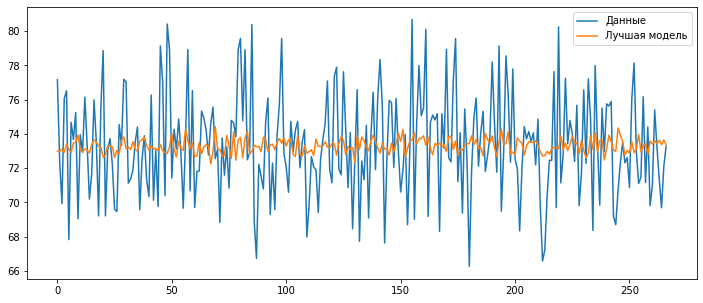

In [83]:
# Визуализация
fig, ax = plt.subplots(figsize=(12, 5))
ax.plot(y_mod_test, label='Данные')
ax.plot(y_pred, label='Лучшая модель')
ax.legend()
plt.show()

### Ridge regression

Гиперпараметры для поиска по сетке

In [84]:
params = [{'alpha': [1, 1.5, 2, 2.5, 3, 4, 5 ,6,7, 8, 9],
           "solver": ['svd', 'cholesky', 'lsqr', 'sparse_cg', 'sag', 'saga']}]

Поиск по сетке с перекрестной проверкой

In [85]:
ridge_reg = Ridge()
cv_scheme = KFold(n_splits=10, shuffle=True, random_state=42)

cv = GridSearchCV(estimator=ridge_reg,param_grid=params,
                  scoring='neg_root_mean_squared_error', cv=cv_scheme, return_train_score=True, n_jobs=-1)

cv.fit(x_mod_train, y_mod_train)
model_list.append(cv.best_estimator_)

In [86]:
print("Лучший параметр для гребневой регрессии:")
print(cv.best_params_)
print("Лучший средний балл перекрестной проверки:")
print(cv.best_score_)

Лучший параметр для гребневой регрессии:
{'alpha': 9, 'solver': 'lsqr'}
Лучший средний балл перекрестной проверки:
-3.077050229071317


Оценка  по полному набору данных

In [87]:
alpha = cv.best_params_['alpha']
solver = cv.best_params_['solver']

ridge_reg = Ridge(alpha=alpha, solver=solver)
ridge_reg.fit(x_mod_train, y_mod_train)

y_pred = ridge_reg.predict(x_mod_test)

ridge_r2 = r2_score(y_mod_test, y_pred)
ridge_mae = mean_absolute_error(y_mod_test, y_pred)
ridge_mse = mean_squared_error(y_mod_test, y_pred, squared=False)
print("---RIDGE REGRESSION---")
print("R2 score: "+str(ridge_r2))
print("Mean Absolute Error: "+str(ridge_mae))
print("Mean Squared Error: "+str(ridge_mse))

r2_scores["ridge_regression"] = ridge_r2
mae_scores["ridge_regression"] = ridge_mae
mse_scores["ridge_regression"] = ridge_mse

---RIDGE REGRESSION---
R2 score: 0.004166620457863757
Mean Absolute Error: 2.37848383379801
Mean Squared Error: 2.9647339196201155


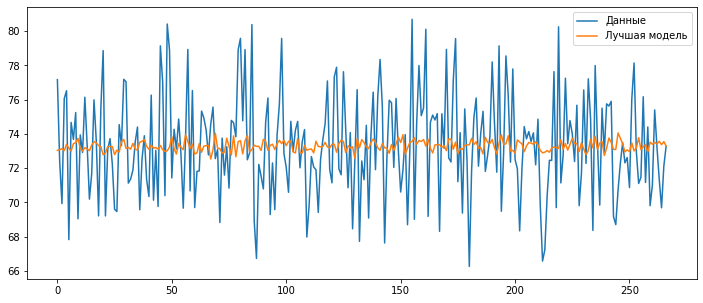

In [88]:
# Визуализация
fig, ax = plt.subplots(figsize=(12, 5))
ax.plot(y_mod_test, label='Данные')
ax.plot(y_pred, label='Лучшая модель')
ax.legend()
plt.show()

### Lasso regression

In [89]:
params = [{'alpha': [0.0006, 0.0005, 0.0004,0.0003,0.0002,0.0001]}]

In [90]:
lasso_reg = Lasso(max_iter=5000)
cv_scheme = KFold(n_splits=10, shuffle=True, random_state=1)
cv = GridSearchCV(estimator=lasso_reg, param_grid=params,
                  scoring='neg_root_mean_squared_error', cv=cv_scheme, return_train_score=True, n_jobs=-1)

cv.fit(x_mod_train, y_mod_train)
model_list.append(cv.best_estimator_)

In [91]:
print("Лучший параметр для Лассо регрессии :")
print(cv.best_params_)
print("Наилучший средний показатель перекрестной проверки:")
print(cv.best_score_)

Лучший параметр для Лассо регрессии :
{'alpha': 0.0006}
Наилучший средний показатель перекрестной проверки:
-3.0804484286415907


In [92]:
alpha = cv.best_params_['alpha']

lasso_reg = Lasso(max_iter=5000, alpha=alpha)
lasso_reg.fit(x_mod_train, y_mod_train)

y_pred = lasso_reg.predict(x_mod_test)
lasso_r2 = r2_score(y_mod_test, y_pred)
lasso_mae = mean_absolute_error(y_mod_test, y_pred)
lasso_mse = mean_squared_error(y_mod_test, y_pred, squared=False)
print("---LASSO REGRESSION---")
print("R2 score: "+str(lasso_r2))
print("Mean Absolute Error: "+str(lasso_mae))
print("Mean Squared Error: "+str(lasso_mse))

r2_scores["lasso_regression"] = lasso_r2
mae_scores["lasso_regression"] = lasso_mae
mse_scores["lasso_regression"] = lasso_mse

---LASSO REGRESSION---
R2 score: 0.001960255009138989
Mean Absolute Error: 2.3854820886474504
Mean Squared Error: 2.968016430235737


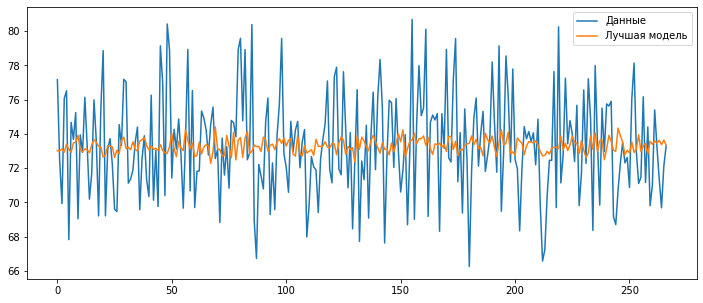

In [93]:
# Визуализация
fig, ax = plt.subplots(figsize=(12, 5))
ax.plot(y_mod_test, label='Данные')
ax.plot(y_pred, label='Лучшая модель')
ax.legend()
plt.show()

### GradientBoostingRegressor

In [94]:
params = [{'n_estimators': [10, 30, 50,70,90,100],
           'learning_rate': [0, 0.1, 0.4,0.6,0.8,1,5],
           'random_state': [0, 1]}]

In [95]:
gbr_reg = GradientBoostingRegressor()
cv_scheme = KFold(n_splits=10, shuffle=True, random_state=1)
cv = GridSearchCV(estimator=gbr_reg, param_grid=params,
                  scoring='neg_root_mean_squared_error', cv=cv_scheme, return_train_score=True, n_jobs=-1)

cv.fit(x_mod_train, y_mod_train)
model_list.append(cv.best_estimator_)

In [96]:
print("Лучший параметр для Градиентного спуска :")
print(cv.best_params_)
print("Наилучший средний показатель перекрестной проверки:")
print(cv.best_score_)

Лучший параметр для Градиентного спуска :
{'learning_rate': 0, 'n_estimators': 10, 'random_state': 0}
Наилучший средний показатель перекрестной проверки:
-3.0620861628658824


In [97]:
n_estimators = cv.best_params_['n_estimators']
learning_rate = cv.best_params_['learning_rate']
random_state = cv.best_params_['random_state']

reg = GradientBoostingRegressor(n_estimators=n_estimators, learning_rate=learning_rate, random_state=random_state)
reg.fit(x_mod_train, y_mod_train)

y_pred = reg.predict(x_mod_test)
reg_r2 = r2_score(y_mod_test, y_pred)
reg_mae = mean_absolute_error(y_mod_test, y_pred)
reg_mse = mean_squared_error(y_mod_test, y_pred, squared=False)

print("---GradientBoostingRegressor---")
print("R2 score: "+str(reg_r2))
print("Mean Absolute Error: "+str(reg_mae))
print("Mean Squared Error: "+str(reg_mse))

r2_scores["GradientBoostingRegressor"] = reg_r2
mae_scores["GradientBoostingRegressor"] = reg_mae
mse_scores["GradientBoostingRegressor"] = reg_mse

---GradientBoostingRegressor---
R2 score: -0.0008706026070781636
Mean Absolute Error: 2.3761310928601964
Mean Squared Error: 2.972222716846718


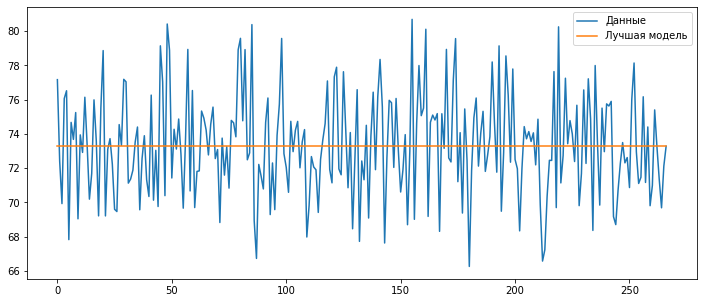

In [98]:
# Визуализация
fig, ax = plt.subplots(figsize=(12, 5))
ax.plot(y_mod_test, label='Данные')
ax.plot(y_pred, label='Лучшая модель')
ax.legend()
plt.show()

### RandomForestRegressor

In [99]:
params = [{
    'random_state': [42],
    'n_estimators': [50, 100], 
    'criterion': ['absolute_error'],
    'max_depth': [2, 3, 4, 5],
    'max_features': [1, 2, 11]
}]

In [100]:
rfr_reg = RandomForestRegressor()
cv_scheme = KFold(n_splits=10, shuffle=True, random_state=1)
cv = GridSearchCV(estimator=rfr_reg, param_grid=params,
                  scoring='neg_root_mean_squared_error', cv=cv_scheme, return_train_score=True, n_jobs=-1)

cv.fit(x_mod_train, y_mod_train)
model_list.append(cv.best_estimator_)

In [101]:
print("Лучший параметр для Случайного леса :")
print(cv.best_params_)
print("Наилучший средний показатель перекрестной проверки:")
print(cv.best_score_)

Лучший параметр для Случайного леса :
{'criterion': 'absolute_error', 'max_depth': 4, 'max_features': 1, 'n_estimators': 50, 'random_state': 42}
Наилучший средний показатель перекрестной проверки:
-3.054380800300416


In [102]:
random_state = cv.best_params_['random_state']
n_estimators = cv.best_params_['n_estimators']
criterion = cv.best_params_['criterion']
max_depth = cv.best_params_['max_depth']
max_features = cv.best_params_['max_features']

rforest_reg = RandomForestRegressor(random_state = random_state, n_estimators =n_estimators, criterion = criterion, max_depth = max_depth, max_features = max_features)
rforest_reg.fit(x_mod_train, y_mod_train)

y_pred = rforest_reg.predict(x_mod_test)

rforest_r2 = r2_score(y_mod_test, y_pred)
rforest_mae = mean_absolute_error(y_mod_test, y_pred)
rforest_mse = mean_squared_error(y_mod_test, y_pred, squared=False)
print("---RANDOM FOREST REGRESSOR---")
print("R2 score: "+str(rforest_r2))
print("Mean Absolute Error: "+str(rforest_mae))
print("Mean Squared Error: "+str(rforest_mse))

r2_scores["random_forest"] = rforest_r2
mae_scores["random_forest"] = rforest_mae
mse_scores["random_forest"] = rforest_mse

---RANDOM FOREST REGRESSOR---
R2 score: -0.0108193711521134
Mean Absolute Error: 2.3903545427242507
Mean Squared Error: 2.986958306325964


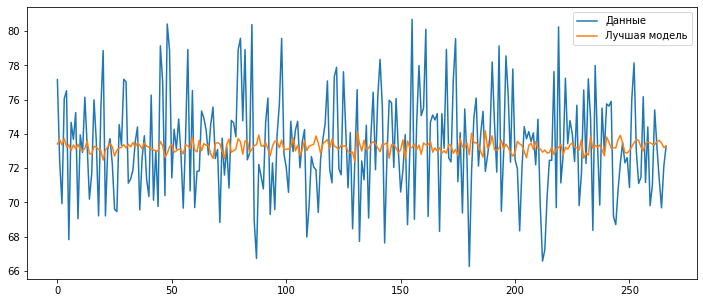

In [103]:
# Визуализация
fig, ax = plt.subplots(figsize=(12, 5))
ax.plot(y_mod_test, label='Данные')
ax.plot(y_pred, label='Лучшая модель')
ax.legend()
plt.show()

### DecisionTreeRegressor

In [104]:
params = [{
    'random_state': [42],
    'criterion': ['squared_error', 'friedman_mse', 'absolute_error', 'poisson'],
    'splitter': ['best', 'random'],
    'max_depth': [1, 2, 3],
    'max_features': range(1, 11, 1)
}]

In [105]:
dtr_reg = DecisionTreeRegressor()
cv_scheme = KFold(n_splits=10, shuffle=True, random_state=1)
cv = GridSearchCV(estimator=dtr_reg, param_grid=params,
                  scoring='neg_root_mean_squared_error', cv=cv_scheme, return_train_score=True, n_jobs=-1)

cv.fit(x_mod_train, y_mod_train)
model_list.append(cv.best_estimator_)

In [106]:
print("Лучший параметр для Дерева решений :")
print(cv.best_params_)
print("Наилучший средний показатель перекрестной проверки:")
print(cv.best_score_)

Лучший параметр для Дерева решений :
{'criterion': 'squared_error', 'max_depth': 1, 'max_features': 1, 'random_state': 42, 'splitter': 'best'}
Наилучший средний показатель перекрестной проверки:
-3.0416309656077427


In [107]:
random_state = cv.best_params_['random_state']
criterion = cv.best_params_['criterion']
splitter = cv.best_params_['splitter']
max_depth = cv.best_params_['max_depth']
max_features = cv.best_params_['max_features']

dtree_reg = DecisionTreeRegressor(random_state = random_state, criterion = criterion, splitter =splitter,  max_depth = max_depth, max_features = max_features)
dtree_reg.fit(x_mod_train, y_mod_train)

y_pred = dtree_reg.predict(x_mod_test)

dtree_r2 = r2_score(y_mod_test, y_pred)
dtree_mae = mean_absolute_error(y_mod_test, y_pred)
dtree_mse = mean_squared_error(y_mod_test, y_pred, squared=False)
print("---Decision Tree REGRESSOR---")
print("R2 score: "+str(dtree_r2))
print("Mean Absolute Error: "+str(dtree_mae))
print("Mean Squared Error: "+str(dtree_mse))

r2_scores["decision_Tree"] = dtree_r2
mae_scores["decision_Tree"] = dtree_mae
mse_scores["decision_Tree"] = dtree_mse

---Decision Tree REGRESSOR---
R2 score: -0.08117518996093809
Mean Absolute Error: 2.4734913159219225
Mean Squared Error: 3.0891601093554004


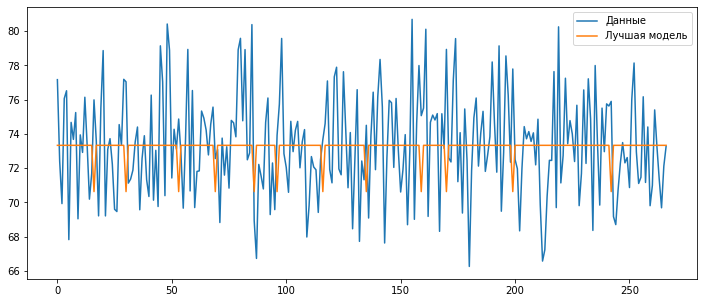

In [108]:
# Визуализация
fig, ax = plt.subplots(figsize=(12, 5))
ax.plot(y_mod_test, label='Данные')
ax.plot(y_pred, label='Лучшая модель')
ax.legend()
plt.show()

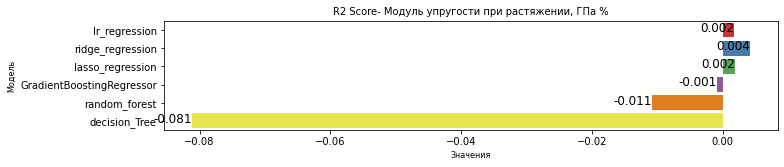

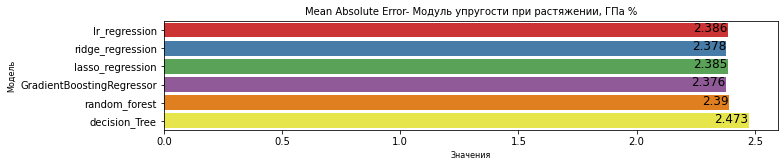

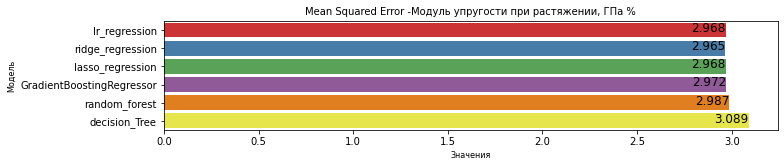

In [109]:
#визуализируем наши метрики
scores = [r2_scores, mae_scores, mse_scores]
titles = ['R2 Score- Модуль упругости при растяжении, ГПа %', 'Mean Absolute Error- Модуль упругости при растяжении, ГПа %', 'Mean Squared Error -Модуль упругости при растяжении, ГПа %']

for i in range(len(scores)):
    plt.figure(figsize=(11, 2))
    graph = sns.barplot(x=list(scores[i].values()), y=list(
        scores[i].keys()), palette="Set1")
    plt.title(titles[i], fontsize=10)
    plt.xlabel("Значения", fontsize=8)
    plt.ylabel("Модель", fontsize=8)
   
    for p in graph.patches:
        if not math.isnan(p.get_width()):
            x_ = p.get_width() - graph.patches[0].get_width()*0
            y_ = p.get_y() + p.get_height() - 0.3
            value = round(p.get_width(), 3)
            graph.text(x_, y_, value, ha="right", color='black', size='large')    
    plt.show()
   

In [110]:
scores_mod = scores

Сохранение лучшей модели

In [111]:
model_list

[LinearRegression(),
 Ridge(alpha=9, solver='lsqr'),
 Lasso(alpha=0.0006, max_iter=5000),
 GradientBoostingRegressor(learning_rate=0, n_estimators=10, random_state=0),
 RandomForestRegressor(criterion='absolute_error', max_depth=4, max_features=1,
                       n_estimators=50, random_state=42),
 DecisionTreeRegressor(max_depth=1, max_features=1, random_state=42)]

In [112]:
model_mod_ = model_list

In [113]:
import pickle

In [114]:
pickle.dump(model_mod_[1], open('model_for_mod.pkl', 'wb'))

In [115]:
model_list[1]

Ridge(alpha=9, solver='lsqr')

In [116]:
model_mod_[1]

Ridge(alpha=9, solver='lsqr')

# **Модель для прочности при растяжении**

Список моделей:

- LinearRegression
- Ridge
- Lasso
- GradientBoosting
- Random Forest
- DecisionTreeRegressor

In [118]:
# Создадим списки для хранения результатов проверки протестированных моделей
r2_scores = {}
mae_scores = {}
mse_scores = {}

In [119]:
# Создадим список для хранения лучших моделей
model_list = []

### Линейная регрессия

In [120]:
lr = LinearRegression()
lr.fit(x_str_train, y_str_train)

y_pred = lr.predict(x_str_test)

lr_r2 = r2_score(y_str_test, y_pred)
lr_mae = mean_absolute_error(y_str_test, y_pred)
lr_mse = mean_squared_error(y_str_test, y_pred, squared=False)
print("---Linear REGRESSION---")
print("R2 score: "+str(lr_r2))
print("Mean Absolute Error: "+str(lr_mae))
print("Mean Squared Error: "+str(lr_mse))

r2_scores["lr_regression"] = lr_r2
mae_scores["lr_regression"] = lr_mae
mse_scores["lr_regression"] = lr_mse


---Linear REGRESSION---
R2 score: -0.04005632125533132
Mean Absolute Error: 400.17562617890337
Mean Squared Error: 501.31914794892134


In [121]:
model_list.append(lr)

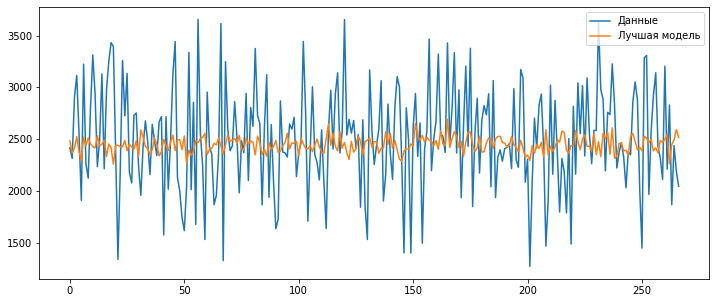

In [122]:
# Визуализация
fig, ax = plt.subplots(figsize=(12, 5))
ax.plot(y_str_test, label='Данные')
ax.plot(y_pred, label='Лучшая модель')
ax.legend()
plt.show()

### Ridge regression

Гиперпараметры для поиска по сетке

In [123]:
params = [{'alpha': [10, 12, 19, 20, 30],
           'solver': ['svd', 'cholesky', 'lsqr', 'sparse_cg', 'sag', 'saga'],
           'random_state': [42]}]

Поиск по сетке с перекрестной проверкой

In [124]:
ridge_reg = Ridge()
cv_scheme = KFold(n_splits=10, shuffle=True, random_state=42)

cv = GridSearchCV(estimator=ridge_reg,param_grid=params,
                  scoring='neg_root_mean_squared_error', cv=cv_scheme, return_train_score=True, n_jobs=-1)

cv.fit(x_str_train, y_str_train)
model_list.append(cv.best_estimator_)

In [125]:
print("Лучший параметр для гребневой регрессии:")
print(cv.best_params_)
print("Лучший средний балл перекрестной проверки:")
print(cv.best_score_)

Лучший параметр для гребневой регрессии:
{'alpha': 19, 'random_state': 42, 'solver': 'sag'}
Лучший средний балл перекрестной проверки:
-438.8956467138563


Оценка  по полному набору данных

In [126]:
alpha = cv.best_params_['alpha']
solver = cv.best_params_['solver']

ridge_reg = Ridge(alpha=alpha, solver=solver, random_state = 42)
ridge_reg.fit(x_str_train, y_str_train)

y_pred = ridge_reg.predict(x_str_test)

ridge_r2 = r2_score(y_str_test, y_pred)
ridge_mae = mean_absolute_error(y_str_test, y_pred)
ridge_mse = mean_squared_error(y_str_test, y_pred, squared=False)
print("---RIDGE REGRESSION---")
print("R2 score: "+str(ridge_r2))
print("Mean Absolute Error: "+str(ridge_mae))
print("Mean Squared Error: "+str(ridge_mse))

r2_scores["ridge_regression"] = ridge_r2
mae_scores["ridge_regression"] = ridge_mae
mse_scores["ridge_regression"] = ridge_mse

---RIDGE REGRESSION---
R2 score: -0.025892567296613045
Mean Absolute Error: 395.43555632184433
Mean Squared Error: 497.8939000767182


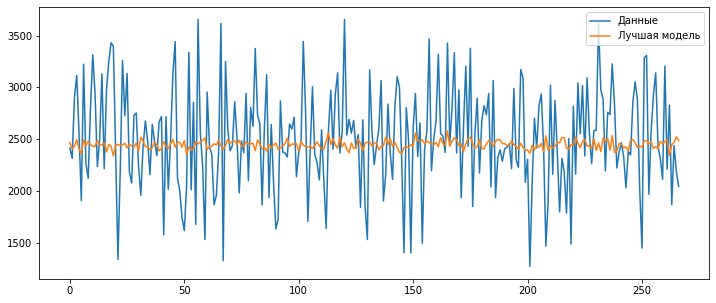

In [127]:
# Визуализация
fig, ax = plt.subplots(figsize=(12, 5))
ax.plot(y_str_test, label='Данные')
ax.plot(y_pred, label='Лучшая модель')
ax.legend()
plt.show()

### Lasso regression

In [128]:
params = [{'alpha': [1, 2, 2.5, 2.6, 2.8]}]

In [129]:
lasso_reg = Lasso(max_iter=5000)
cv_scheme = KFold(n_splits=10, shuffle=True, random_state=1)
cv = GridSearchCV(estimator=lasso_reg, param_grid=params,
                  scoring='neg_root_mean_squared_error', cv=cv_scheme, return_train_score=True, n_jobs=-1)

cv.fit(x_str_train, y_str_train)
model_list.append(cv.best_estimator_)

In [130]:
print("Лучший параметр для Лассо регрессии :")
print(cv.best_params_)
print("Наилучший средний показатель перекрестной проверки:")
print(cv.best_score_)

Лучший параметр для Лассо регрессии :
{'alpha': 2}
Наилучший средний показатель перекрестной проверки:
-437.97478846862


In [131]:
alpha = cv.best_params_['alpha']

lasso_reg = Lasso(max_iter=5000, alpha=alpha)
lasso_reg.fit(x_str_train, y_str_train)

y_pred = lasso_reg.predict(x_str_test)
lasso_r2 = r2_score(y_str_test, y_pred)
lasso_mae = mean_absolute_error(y_str_test, y_pred)
lasso_mse = mean_squared_error(y_str_test, y_pred, squared=False)
print("---LASSO REGRESSION---")
print("R2 score: "+str(lasso_r2))
print("Mean Absolute Error: "+str(lasso_mae))
print("Mean Squared Error: "+str(lasso_mse))

r2_scores["lasso_regression"] = lasso_r2
mae_scores["lasso_regression"] = lasso_mae
mse_scores["lasso_regression"] = lasso_mse

---LASSO REGRESSION---
R2 score: -0.02884290895013697
Mean Absolute Error: 396.5575791542145
Mean Squared Error: 498.60932708139404


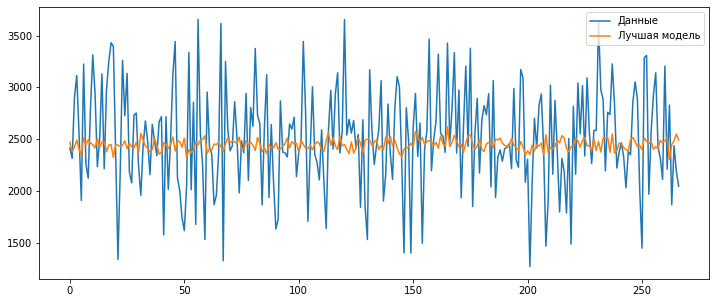

In [132]:
# Визуализация
fig, ax = plt.subplots(figsize=(12, 5))
ax.plot(y_str_test, label='Данные')
ax.plot(y_pred, label='Лучшая модель')
ax.legend()
plt.show()

### GradientBoostingRegressor

In [133]:
params = [{'n_estimators': [50,100, 150, 200],
           'learning_rate': [0, 0.1, 0.4,0.6,0.8,1,5],
           'random_state': [42]}]

In [134]:
gbr_reg = GradientBoostingRegressor()
cv_scheme = KFold(n_splits=10, shuffle=True, random_state=1)
cv = GridSearchCV(estimator=gbr_reg, param_grid=params,
                  scoring='neg_root_mean_squared_error', cv=cv_scheme, return_train_score=True, n_jobs=-1)

cv.fit(x_str_train, y_str_train)
model_list.append(cv.best_estimator_)

In [135]:
print("Лучший параметр для Градиентного бустинга :")
print(cv.best_params_)
print("Наилучший средний показатель перекрестной проверки:")
print(cv.best_score_)

Лучший параметр для Градиентного бустинга :
{'learning_rate': 0, 'n_estimators': 50, 'random_state': 42}
Наилучший средний показатель перекрестной проверки:
-439.8381866832262


In [136]:
n_estimators = cv.best_params_['n_estimators']
learning_rate = cv.best_params_['learning_rate']
random_state = cv.best_params_['random_state']

reg = GradientBoostingRegressor(n_estimators=n_estimators, learning_rate=learning_rate, random_state=random_state)
reg.fit(x_str_train, y_str_train)

y_pred = reg.predict(x_str_test)
reg_r2 = r2_score(y_str_test, y_pred)
reg_mae = mean_absolute_error(y_str_test, y_pred)
reg_mse = mean_squared_error(y_str_test, y_pred, squared=False)

print("---GradientBoostingRegressor---")
print("R2 score: "+str(reg_r2))
print("Mean Absolute Error: "+str(reg_mae))
print("Mean Squared Error: "+str(reg_mse))

r2_scores["GradientBoostingRegressor"] = reg_r2
mae_scores["GradientBoostingRegressor"] = reg_mae
mse_scores["GradientBoostingRegressor"] = reg_mse

---GradientBoostingRegressor---
R2 score: -0.01664797118440009
Mean Absolute Error: 390.9842522808804
Mean Squared Error: 495.6454948937183


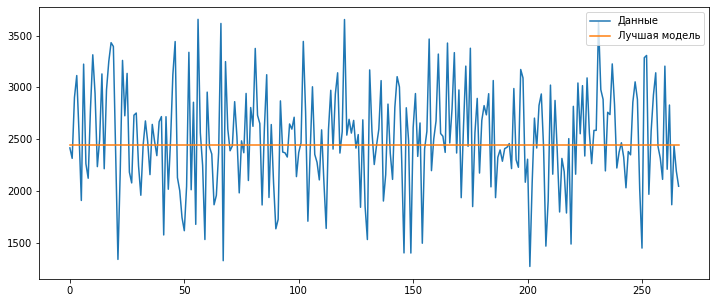

In [137]:
# Визуализация
fig, ax = plt.subplots(figsize=(12, 5))
ax.plot(y_str_test, label='Данные')
ax.plot(y_pred, label='Лучшая модель')
ax.legend()
plt.show()

### RandomForestRegressor

In [138]:
params = [{
    'random_state': [42],
    'n_estimators': [50, 100, 150], 
    'criterion': ['absolute_error'],
    'max_depth': [1, 2, 3, 4, 5],
    'max_features': [1, 2, 10]
}]

In [139]:
rfr_reg = RandomForestRegressor()
cv_scheme = KFold(n_splits=10, shuffle=True, random_state=1)
cv = GridSearchCV(estimator=rfr_reg, param_grid=params,
                  scoring='neg_root_mean_squared_error', cv=cv_scheme, return_train_score=True, n_jobs=-1)

cv.fit(x_str_train, y_str_train)
model_list.append(cv.best_estimator_)

In [140]:
print("Лучший параметр для Случайного леса :")
print(cv.best_params_)
print("Наилучший средний показатель перекрестной проверки:")
print(cv.best_score_)

Лучший параметр для Случайного леса :
{'criterion': 'absolute_error', 'max_depth': 3, 'max_features': 1, 'n_estimators': 150, 'random_state': 42}
Наилучший средний показатель перекрестной проверки:
-437.314944848459


In [141]:
random_state = cv.best_params_['random_state']
n_estimators = cv.best_params_['n_estimators']
criterion = cv.best_params_['criterion']
max_depth = cv.best_params_['max_depth']
max_features = cv.best_params_['max_features']

rforest_reg = RandomForestRegressor(random_state = random_state, n_estimators =n_estimators, criterion = criterion, max_depth = max_depth, max_features = max_features)
rforest_reg.fit(x_str_train, y_str_train)

y_pred = rforest_reg.predict(x_str_test)

rforest_r2 = r2_score(y_str_test, y_pred)
rforest_mae = mean_absolute_error(y_str_test, y_pred)
rforest_mse = mean_squared_error(y_str_test, y_pred, squared=False)
print("---RANDOM FOREST REGRESSOR---")
print("R2 score: "+str(rforest_r2))
print("Mean Absolute Error: "+str(rforest_mae))
print("Mean Squared Error: "+str(rforest_mse))

r2_scores["random_forest"] = rforest_r2
mae_scores["random_forest"] = rforest_mae
mse_scores["random_forest"] = rforest_mse

---RANDOM FOREST REGRESSOR---
R2 score: -0.015014957486727765
Mean Absolute Error: 393.08393143898644
Mean Squared Error: 495.24726404380954


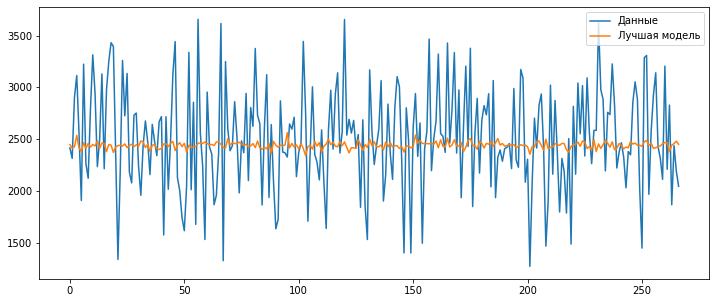

In [142]:
# Визуализация
fig, ax = plt.subplots(figsize=(12, 5))
ax.plot(y_str_test, label='Данные')
ax.plot(y_pred, label='Лучшая модель')
ax.legend()
plt.show()

### DecisionTreeRegressor

In [143]:
params = [{
    'random_state': [42],
    'criterion': ['squared_error', 'friedman_mse', 'absolute_error', 'poisson'],
    'splitter': ['best', 'random'],
    'max_depth': [1, 2, 3],
    'max_features': range(1, 11, 1)
}]

In [144]:
dtr_reg = DecisionTreeRegressor()
cv_scheme = KFold(n_splits=10, shuffle=True, random_state=1)
cv = GridSearchCV(estimator=dtr_reg, param_grid=params,
                  scoring='neg_root_mean_squared_error', cv=cv_scheme, return_train_score=True, n_jobs=-1)

cv.fit(x_str_train, y_str_train)
model_list.append(cv.best_estimator_)

In [145]:
print("Лучший параметр для Дерева решений :")
print(cv.best_params_)
print("Наилучший средний показатель перекрестной проверки:")
print(cv.best_score_)

Лучший параметр для Дерева решений :
{'criterion': 'squared_error', 'max_depth': 2, 'max_features': 6, 'random_state': 42, 'splitter': 'random'}
Наилучший средний показатель перекрестной проверки:
-437.6163811611523


In [146]:
random_state = cv.best_params_['random_state']
criterion = cv.best_params_['criterion']
splitter = cv.best_params_['splitter']
max_depth = cv.best_params_['max_depth']
max_features = cv.best_params_['max_features']

dtree_reg = DecisionTreeRegressor(random_state = random_state, criterion = criterion, splitter =splitter,  max_depth = max_depth, max_features = max_features)
dtree_reg.fit(x_str_train, y_str_train)

y_pred = dtree_reg.predict(x_str_test)

dtree_r2 = r2_score(y_str_test, y_pred)
dtree_mae = mean_absolute_error(y_str_test, y_pred)
dtree_mse = mean_squared_error(y_str_test, y_pred, squared=False)
print("---Decision Tree REGRESSOR---")
print("R2 score: "+str(dtree_r2))
print("Mean Absolute Error: "+str(dtree_mae))
print("Mean Squared Error: "+str(dtree_mse))

r2_scores["decision_Tree"] = dtree_r2
mae_scores["decision_Tree"] = dtree_mae
mse_scores["decision_Tree"] = dtree_mse

---Decision Tree REGRESSOR---
R2 score: -0.02464350886988309
Mean Absolute Error: 394.85697614667646
Mean Squared Error: 497.59070654445736


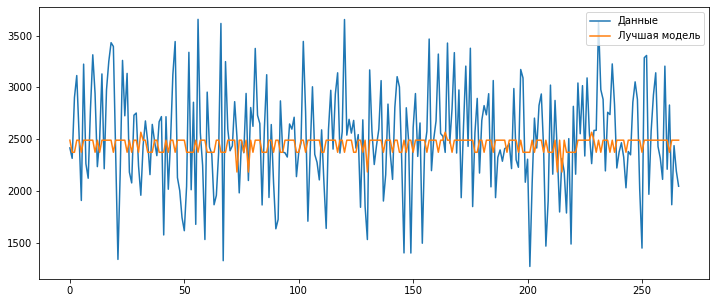

In [147]:
# Визуализация
fig, ax = plt.subplots(figsize=(12, 5))
ax.plot(y_str_test, label='Данные')
ax.plot(y_pred, label='Лучшая модель')
ax.legend()
plt.show()

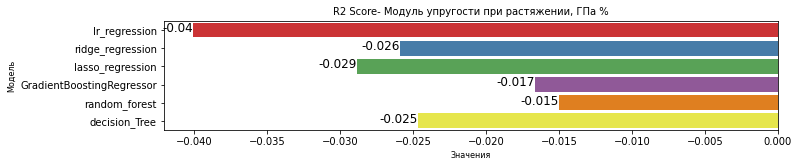

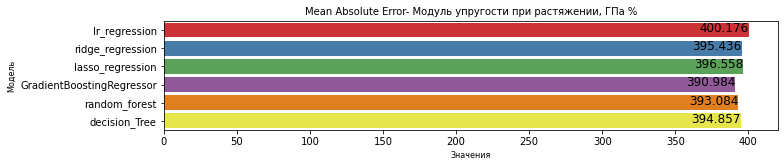

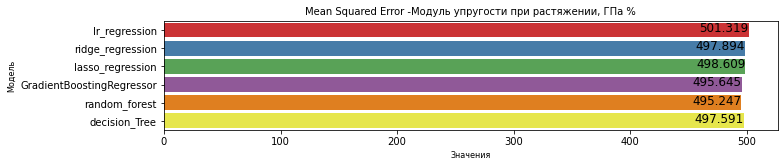

In [148]:
#визуализируем наши метрики
scores = [r2_scores, mae_scores, mse_scores]
titles = ['R2 Score- Модуль прочности при растяжении, ГПа %', 'Mean Absolute Error- Модуль прочности при растяжении, ГПа %', 'Mean Squared Error -Модуль прочности при растяжении, ГПа %']

for i in range(len(scores)):
    plt.figure(figsize=(11, 2))
    graph = sns.barplot(x=list(scores[i].values()), y=list(
        scores[i].keys()), palette="Set1")
    plt.title(titles[i], fontsize=10)
    plt.xlabel("Значения", fontsize=8)
    plt.ylabel("Модель", fontsize=8)
   
    for p in graph.patches:
        if not math.isnan(p.get_width()):
            x_ = p.get_width() - graph.patches[0].get_width()*0
            y_ = p.get_y() + p.get_height() - 0.3
            value = round(p.get_width(), 3)
            graph.text(x_, y_, value, ha="right", color='black', size='large')    
    plt.show()
   

In [149]:
scores_str = scores

In [150]:
model_list

[LinearRegression(),
 Ridge(alpha=19, random_state=42, solver='sag'),
 Lasso(alpha=2, max_iter=5000),
 GradientBoostingRegressor(learning_rate=0, n_estimators=50, random_state=42),
 RandomForestRegressor(criterion='absolute_error', max_depth=3, max_features=1,
                       n_estimators=150, random_state=42),
 DecisionTreeRegressor(max_depth=2, max_features=6, random_state=42,
                       splitter='random')]

In [151]:
model_str_ = model_list

In [152]:
model_list[4]

RandomForestRegressor(criterion='absolute_error', max_depth=3, max_features=1,
                      n_estimators=150, random_state=42)

In [153]:
model_str_[4]

RandomForestRegressor(criterion='absolute_error', max_depth=3, max_features=1,
                      n_estimators=150, random_state=42)

In [154]:

pickle.dump(model_str_[4], open('model_for_str.pkl', 'wb'))

## **Рекомендательная нейросеть для соотношения матрица-наполнитель**

In [155]:
import tensorflow as tf
from tensorflow import keras as keras
from tensorflow.keras import layers
from tensorflow.keras.layers import Dense, Flatten, Dropout, BatchNormalization, Activation
from pandas import read_excel, DataFrame, Series
from keras.wrappers.scikit_learn import KerasClassifier, KerasRegressor
from tensorflow.keras.models import Sequential

Выборки для рекомендательной нейросети

In [156]:
x_nn_train_, x_nn_test_, y_nn_train, y_nn_test = train_test_split(X, y.iloc[:,2], test_size=0.3, random_state=42)
print('x_train:', x_nn_train_.shape, 'y_train:', y_nn_train.shape)
print('x_test:', x_nn_test_.shape, 'y_test:', y_nn_test.shape)

x_train: (623, 10) y_train: (623,)
x_test: (267, 10) y_test: (267,)


In [157]:
# Выполняю препроцессинг входных переменных
x_nn_train = preprocessor.fit_transform(x_nn_train_)
x_nn_test = preprocessor.transform(x_nn_test_)

In [158]:
#Выходная переменная преобразованиям не подвергается
y_nn_train = y_nn_train.values
y_nn_test = y_nn_test.values

Функция для визуализации тестовых и прогнозных значений 

In [159]:
# Для целевой переменной "Соотношение матрица-наполнитель"
def predicted_ns(y_test, y_pred):
  plt.figure(figsize=(15, 10))
  plt.title(f'Тест и прогноз, Соотношение матрица-наполнитель: ')
  plt.plot(y_test, label='Тест', color = 'steelblue')
  plt.plot(y_pred, label='Прогноз', color = 'gold')
  plt.legend(loc='best')
  plt.xlabel('Количество наблюдений')
  plt.ylabel('Соотношение матрица-наполнитель')

Варианты моделей Нейронной сети

In [196]:
# Функция для визуализации процесса обучения Нейронной сети
def plot_loss(history):
    plt.plot(history.history['loss'], label='loss')
    plt.plot(history.history['val_loss'], label='val_loss')
    plt.xlabel('Эпоха')

    plt.ylabel('MAE [MPG]')
    plt.legend()
    plt.grid(True)

Модель 1

In [206]:
model_11 = keras.Sequential()

# Входной Dense слой с кол-вом нейронов = 50, входная размерность = кол-ву факторных переменных
model_11.add(Dense(50, input_dim = x_nn_train.shape[1], activation = lambda x: x**2 + 2*x + 1))
# слой Dropout для избежания переобучения (от 10 до 50%)
model_11.add(Dropout(0.12))

# Dense слой с кол-вом нейронов = 128, Dropout слой
model_11.add(Dense(128, activation = lambda x: x**2 + 2*x + 1))
model_11.add(Dropout(0.12))

# Dense слой с кол-вом нейронов = 64, Dropout слой
model_11.add(Dense(64, activation = lambda x: x**2 + 2*x + 1))
model_11.add(Dropout(0.12))

# Dense слой с кол-вом нейронов = 32, Dropout слой
model_11.add(Dense(32, activation = lambda x: x**2 + 2*x + 1))
model_11.add(Dropout(0.12))

# Выходной слой
model_11.add(Dense(1))

model_11.summary()

Model: "sequential_11"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 dense_53 (Dense)            (None, 50)                550       
                                                                 
 dropout_42 (Dropout)        (None, 50)                0         
                                                                 
 dense_54 (Dense)            (None, 128)               6528      
                                                                 
 dropout_43 (Dropout)        (None, 128)               0         
                                                                 
 dense_55 (Dense)            (None, 64)                8256      
                                                                 
 dropout_44 (Dropout)        (None, 64)                0         
                                                                 
 dense_56 (Dense)            (None, 32)              

In [207]:
# Конфигурация обучения (оптимизатор, функция потерь, метрики)
model_11.compile(optimizer='adam', loss='mae', metrics=['mae', 'mse'])

# Обучаем модель на тестовых данных
history = model_11.fit(
    x_nn_train, y_nn_train,
    validation_split = 0.2,
    verbose=1, epochs = 100)

Epoch 1/100
16/16 [==============================] - 4s 28ms/step - loss: 437.0676 - mae: 437.0676 - mse: 719773.1875 - val_loss: 8.4314 - val_mae: 8.4314 - val_mse: 124.4285
Epoch 2/100
16/16 [==============================] - 0s 5ms/step - loss: 53.4455 - mae: 53.4455 - mse: 6566.1777 - val_loss: 3.2908 - val_mae: 3.2908 - val_mse: 18.6871
Epoch 3/100
16/16 [==============================] - 0s 5ms/step - loss: 27.0652 - mae: 27.0652 - mse: 1512.9092 - val_loss: 3.2238 - val_mae: 3.2238 - val_mse: 14.9963
Epoch 4/100
16/16 [==============================] - 0s 6ms/step - loss: 20.9161 - mae: 20.9161 - mse: 894.3829 - val_loss: 2.5348 - val_mae: 2.5348 - val_mse: 10.1727
Epoch 5/100
16/16 [==============================] - 0s 6ms/step - loss: 17.4693 - mae: 17.4693 - mse: 654.5499 - val_loss: 2.8597 - val_mae: 2.8597 - val_mse: 10.9436
Epoch 6/100
16/16 [==============================] - 0s 5ms/step - loss: 14.5448 - mae: 14.5448 - mse: 464.6994 - val_loss: 2.6152 - val_mae: 2.6152 - 

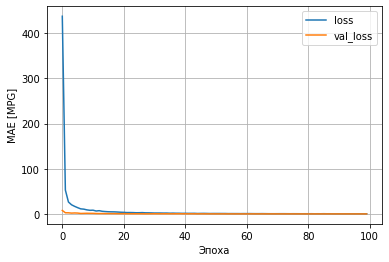

In [208]:
plot_loss(history)

9/9 [==============================] - 0s 3ms/step


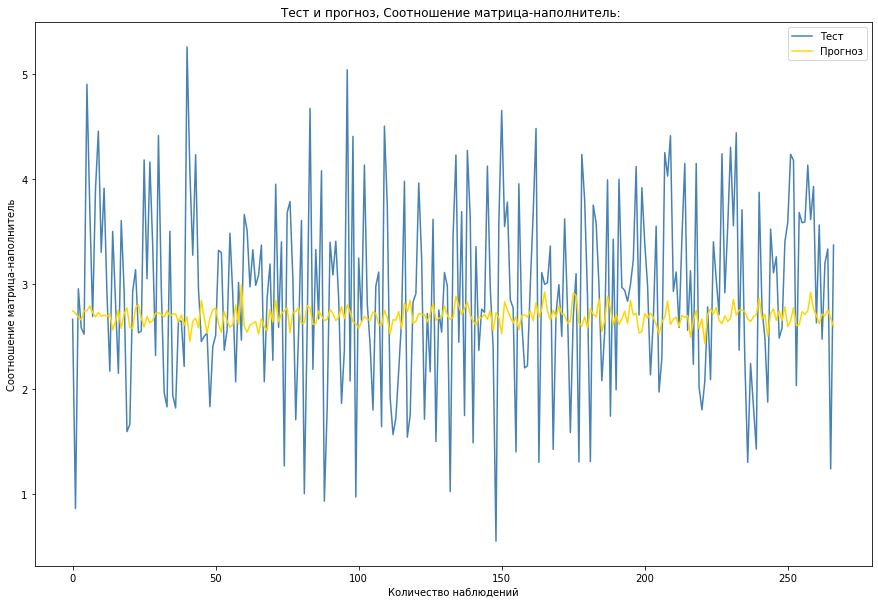

In [209]:
predicted_ns(y_nn_test, model_11.predict(x_nn_test))

In [210]:
# Оценка модели
MSE = mean_squared_error(y_nn_test, model_11.predict(x_nn_test))
R2 = r2_score(y_nn_test, model_11.predict(x_nn_test))

print(f'MSE NN = {MSE}')
print(f'R2_score NN = {R2}')

9/9 [==============================] - 0s 2ms/step
MSE NN = 0.8292924300720008
R2_score NN = -0.06582529938670234


Модель 2

Попробуем увеличить кол-во эпох до 150

In [205]:
model_12 = keras.Sequential()

# Входной Dense слой с кол-вом нейронов = 50, входная размерность = кол-ву факторных переменных
model_12.add(Dense(50, input_dim = x_nn_train.shape[1], activation = lambda x: x**2 + 2*x + 1))
# слой Dropout для избежания переобучения (от 10 до 50%)
model_12.add(Dropout(0.12))

# Dense слой с кол-вом нейронов = 128, Dropout слой
model_12.add(Dense(128, activation = lambda x: x**2 + 2*x + 1))
model_12.add(Dropout(0.12))

# Dense слой с кол-вом нейронов = 64, Dropout слой
model_12.add(Dense(64, activation = lambda x: x**2 + 2*x + 1))
model_12.add(Dropout(0.12))

# Dense слой с кол-вом нейронов = 32, Dropout слой
model_12.add(Dense(32, activation = lambda x: x**2 + 2*x + 1))
model_12.add(Dropout(0.12))

# Выходной слой
model_12.add(Dense(1))

model_12.summary()

Model: "sequential_10"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 dense_48 (Dense)            (None, 50)                550       
                                                                 
 dropout_38 (Dropout)        (None, 50)                0         
                                                                 
 dense_49 (Dense)            (None, 128)               6528      
                                                                 
 dropout_39 (Dropout)        (None, 128)               0         
                                                                 
 dense_50 (Dense)            (None, 64)                8256      
                                                                 
 dropout_40 (Dropout)        (None, 64)                0         
                                                                 
 dense_51 (Dense)            (None, 32)              

In [211]:
# Конфигурация обучения (оптимизатор, функция потерь, метрики)
model_12.compile(optimizer='adam', loss='mae', metrics=['mae', 'mse'])

# Обучаем модель на тестовых данных
history = model_12.fit(
    x_nn_train, y_nn_train,
    validation_split = 0.2,
    verbose=1, epochs = 150)

Epoch 1/150
16/16 [==============================] - 3s 19ms/step - loss: 123.9878 - mae: 123.9878 - mse: 49017.8438 - val_loss: 2.9417 - val_mae: 2.9417 - val_mse: 15.3561
Epoch 2/150
16/16 [==============================] - 0s 5ms/step - loss: 16.6903 - mae: 16.6903 - mse: 546.6559 - val_loss: 3.7813 - val_mae: 3.7813 - val_mse: 16.3141
Epoch 3/150
16/16 [==============================] - 0s 5ms/step - loss: 9.2741 - mae: 9.2741 - mse: 181.5808 - val_loss: 3.0582 - val_mae: 3.0582 - val_mse: 10.7837
Epoch 4/150
16/16 [==============================] - 0s 5ms/step - loss: 6.2974 - mae: 6.2974 - mse: 97.2510 - val_loss: 2.3885 - val_mae: 2.3885 - val_mse: 7.1185
Epoch 5/150
16/16 [==============================] - 0s 5ms/step - loss: 4.8166 - mae: 4.8166 - mse: 41.5303 - val_loss: 1.9864 - val_mae: 1.9864 - val_mse: 5.1225
Epoch 6/150
16/16 [==============================] - 0s 5ms/step - loss: 4.5859 - mae: 4.5859 - mse: 39.5287 - val_loss: 2.0606 - val_mae: 2.0606 - val_mse: 5.3783
E

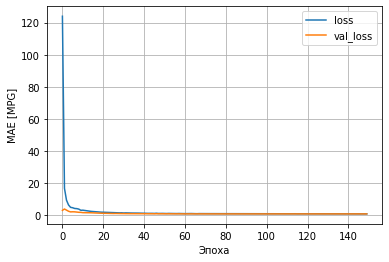

In [212]:
plot_loss(history)

9/9 [==============================] - 0s 2ms/step


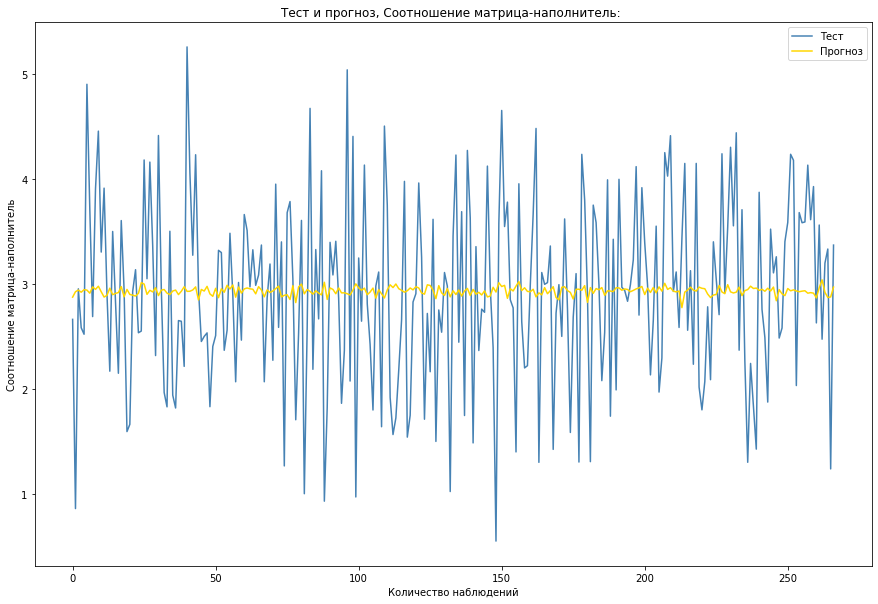

In [213]:
predicted_ns(y_nn_test, model_12.predict(x_nn_test))

In [214]:
# Оценка модели
MSE = mean_squared_error(y_nn_test, model_12.predict(x_nn_test))
R2 = r2_score(y_nn_test, model_12.predict(x_nn_test))

print(f'MSE NN = {MSE}')
print(f'R2_score NN = {R2}')

9/9 [==============================] - 0s 2ms/step
MSE NN = 0.7819733493827921
R2_score NN = -0.005009751681894992


По графику процесса обучения и метрикам можно утверждать, что качество НС улучшелось

Модель 3

А теперь уменьшим количество эпох до 75

In [176]:
model_13 = keras.Sequential()

# Входной Dense слой с кол-вом нейронов = 50, входная размерность = кол-ву факторных переменных
model_13.add(Dense(50, input_dim = x_nn_train.shape[1], activation = lambda x: x**2 + 2*x + 1))
# слой Dropout для избежания переобучения (от 10 до 50%)
model_13.add(Dropout(0.12))

# Dense слой с кол-вом нейронов = 128, Dropout слой
model_13.add(Dense(128, activation = lambda x: x**2 + 2*x + 1))
model_13.add(Dropout(0.12))

# Dense слой с кол-вом нейронов = 64, Dropout слой
model_13.add(Dense(64, activation = lambda x: x**2 + 2*x + 1))
model_13.add(Dropout(0.12))

# Dense слой с кол-вом нейронов = 32, Dropout слой
model_13.add(Dense(32, activation = lambda x: x**2 + 2*x + 1))
model_13.add(Dropout(0.12))

# Выходной слой
model_13.add(Dense(1))

model_13.summary()

Model: "sequential_3"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 dense_15 (Dense)            (None, 50)                550       
                                                                 
 dropout_12 (Dropout)        (None, 50)                0         
                                                                 
 dense_16 (Dense)            (None, 128)               6528      
                                                                 
 dropout_13 (Dropout)        (None, 128)               0         
                                                                 
 dense_17 (Dense)            (None, 64)                8256      
                                                                 
 dropout_14 (Dropout)        (None, 64)                0         
                                                                 
 dense_18 (Dense)            (None, 32)               

In [177]:
# Конфигурация обучения (оптимизатор, функция потерь, метрики)
model_13.compile(optimizer='adam', loss='mae', metrics=['mae', 'mse'])

# Обучаем модель на тестовых данных
history = model_13.fit(
    x_nn_train, y_nn_train,
    validation_split = 0.2,
    verbose=1, epochs = 75)

Epoch 1/75
16/16 [==============================] - 2s 20ms/step - loss: 281.7963 - mae: 281.7963 - mse: 254407.1094 - val_loss: 12.9739 - val_mae: 12.9739 - val_mse: 217.9402
Epoch 2/75
16/16 [==============================] - 0s 6ms/step - loss: 40.9130 - mae: 40.9130 - mse: 3482.7405 - val_loss: 3.1403 - val_mae: 3.1403 - val_mse: 14.5879
Epoch 3/75
16/16 [==============================] - 0s 6ms/step - loss: 18.1858 - mae: 18.1858 - mse: 723.4178 - val_loss: 2.1658 - val_mae: 2.1658 - val_mse: 7.4199
Epoch 4/75
16/16 [==============================] - 0s 6ms/step - loss: 11.4144 - mae: 11.4144 - mse: 239.8553 - val_loss: 1.9413 - val_mae: 1.9413 - val_mse: 5.3993
Epoch 5/75
16/16 [==============================] - 0s 6ms/step - loss: 9.5283 - mae: 9.5283 - mse: 200.3194 - val_loss: 1.9742 - val_mae: 1.9742 - val_mse: 5.2571
Epoch 6/75
16/16 [==============================] - 0s 6ms/step - loss: 7.7264 - mae: 7.7264 - mse: 141.5303 - val_loss: 2.0398 - val_mae: 2.0398 - val_mse: 5.4

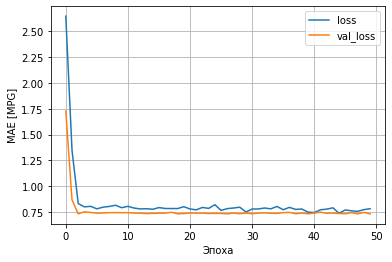

In [198]:
plot_loss(history)

9/9 [==============================] - 0s 3ms/step


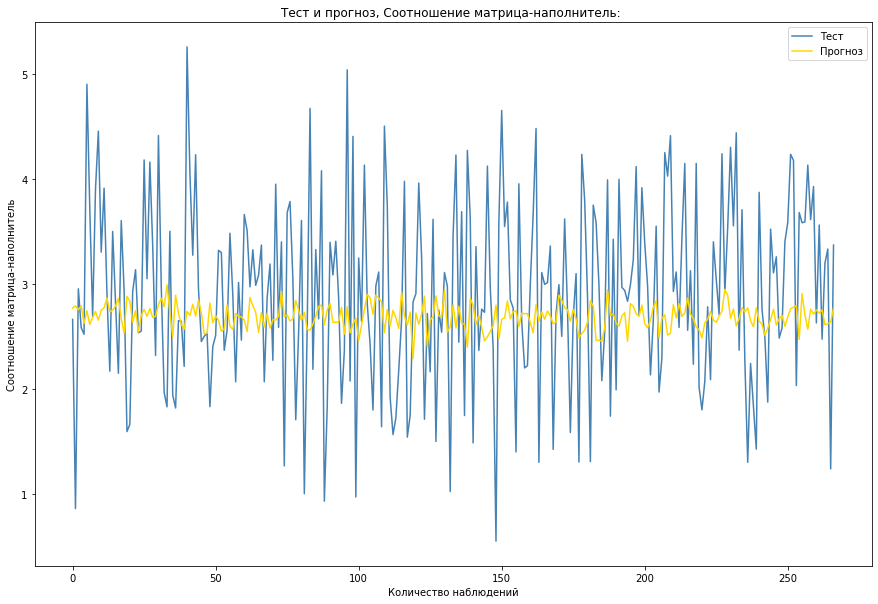

In [179]:
predicted_ns(y_nn_test, model_13.predict(x_nn_test))

In [180]:
# Оценка модели
MSE = mean_squared_error(y_nn_test, model_13.predict(x_nn_test))
R2 = r2_score(y_nn_test, model_13.predict(x_nn_test))

print(f'MSE NN = {MSE}')
print(f'R2_score NN = {R2}')

9/9 [==============================] - 0s 3ms/step
MSE NN = 0.8551036364159719
R2_score NN = -0.09899844281779147


При снижении кол-ва эпох качество модели стало хуже

Модель 4

Попробуем убрать слой с 32 нейронами и Dropout слой

In [181]:
model_21 = keras.Sequential()

# Входной Dense слой с кол-вом нейронов = 50, входная размерность = кол-ву факторных переменных
model_21.add(Dense(50, input_dim = x_nn_train.shape[1], activation = lambda x: x**2 + 2*x + 1))
# слой Dropout для избежания переобучения (от 10 до 50%)
model_21.add(Dropout(0.12))

# Dense слой с кол-вом нейронов = 128, Dropout слой
model_21.add(Dense(128, activation = lambda x: x**2 + 2*x + 1))
model_21.add(Dropout(0.12))

# Dense слой с кол-вом нейронов = 64, Dropout слой
model_21.add(Dense(64, activation = lambda x: x**2 + 2*x + 1))
model_21.add(Dropout(0.12))


# Выходной слой
model_21.add(Dense(1))

model_21.summary()

Model: "sequential_4"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 dense_20 (Dense)            (None, 50)                550       
                                                                 
 dropout_16 (Dropout)        (None, 50)                0         
                                                                 
 dense_21 (Dense)            (None, 128)               6528      
                                                                 
 dropout_17 (Dropout)        (None, 128)               0         
                                                                 
 dense_22 (Dense)            (None, 64)                8256      
                                                                 
 dropout_18 (Dropout)        (None, 64)                0         
                                                                 
 dense_23 (Dense)            (None, 1)                

In [182]:
# Конфигурация обучения (оптимизатор, функция потерь, метрики)
model_21.compile(optimizer='adam', loss='mae', metrics=['mae', 'mse'])

# Обучаем модель на тестовых данных
history = model_21.fit(
    x_nn_train, y_nn_train,
    validation_split = 0.2,
    verbose=1, epochs = 100)

Epoch 1/100
16/16 [==============================] - 2s 18ms/step - loss: 12.6249 - mae: 12.6249 - mse: 302.9350 - val_loss: 3.2388 - val_mae: 3.2388 - val_mse: 13.7735
Epoch 2/100
16/16 [==============================] - 0s 5ms/step - loss: 4.0098 - mae: 4.0098 - mse: 26.3403 - val_loss: 1.8201 - val_mae: 1.8201 - val_mse: 4.3957
Epoch 3/100
16/16 [==============================] - 0s 6ms/step - loss: 2.6729 - mae: 2.6729 - mse: 11.5010 - val_loss: 1.0248 - val_mae: 1.0248 - val_mse: 1.7145
Epoch 4/100
16/16 [==============================] - 0s 5ms/step - loss: 1.9434 - mae: 1.9434 - mse: 6.2120 - val_loss: 1.0879 - val_mae: 1.0879 - val_mse: 1.8855
Epoch 5/100
16/16 [==============================] - 0s 5ms/step - loss: 1.6680 - mae: 1.6680 - mse: 4.7133 - val_loss: 0.9386 - val_mae: 0.9386 - val_mse: 1.4736
Epoch 6/100
16/16 [==============================] - 0s 6ms/step - loss: 1.4700 - mae: 1.4700 - mse: 3.6023 - val_loss: 1.2016 - val_mae: 1.2016 - val_mse: 2.1963
Epoch 7/100
16

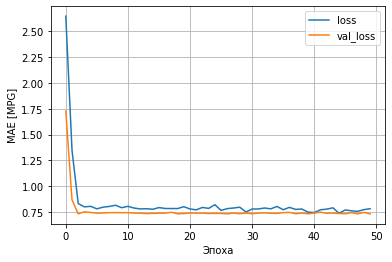

In [199]:
plot_loss(history)

9/9 [==============================] - 0s 3ms/step


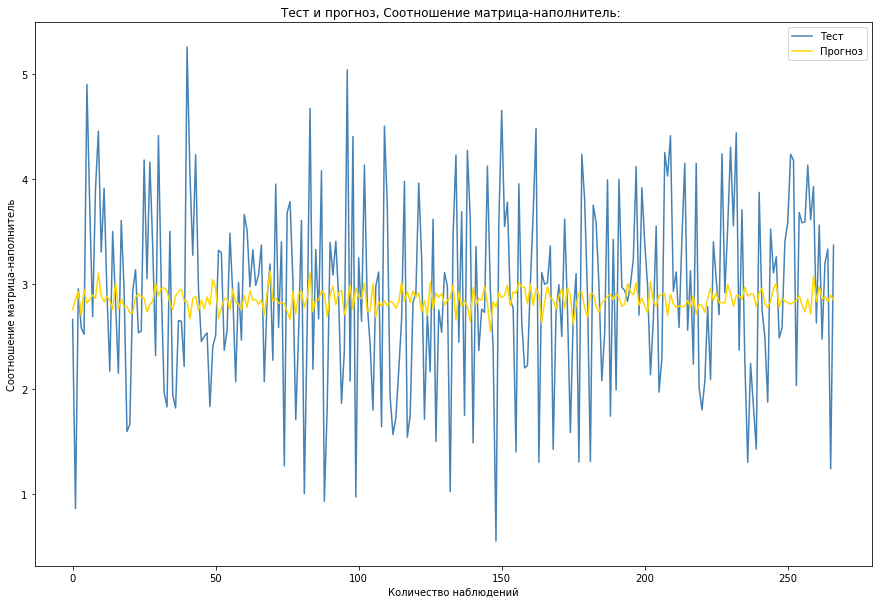

In [184]:
predicted_ns(y_nn_test, model_21.predict(x_nn_test))

In [185]:
# Оценка модели
MSE = mean_squared_error(y_nn_test, model_21.predict(x_nn_test))
R2 = r2_score(y_nn_test, model_21.predict(x_nn_test))

print(f'MSE NN = {MSE}')
print(f'R2_score NN = {R2}')

9/9 [==============================] - 0s 3ms/step
MSE NN = 0.7941917948053766
R2_score NN = -0.02071317278925444


При удалении слоёв качество модели улучшилось, пока что лучшей признана Model 2

Модель 5

попробуем заменить активационную функцию в Dense-слое  на softplus.

In [186]:
model_22 = keras.Sequential()

# Входной Dense слой с кол-вом нейронов = 50, входная размерность = кол-ву факторных переменных
model_22.add(Dense(50, input_dim = x_nn_train.shape[1], activation = 'softplus'))
# слой Dropout для избежания переобучения (от 10 до 50%)
model_22.add(Dropout(0.12))

# Dense слой с кол-вом нейронов = 128, Dropout слой
model_22.add(Dense(128, activation = 'softplus'))
model_22.add(Dropout(0.12))

# Dense слой с кол-вом нейронов = 64, Dropout слой
model_22.add(Dense(64, activation = 'softplus'))
model_22.add(Dropout(0.12))


# Выходной слой
model_22.add(Dense(1))

model_22.summary()

Model: "sequential_5"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 dense_24 (Dense)            (None, 50)                550       
                                                                 
 dropout_19 (Dropout)        (None, 50)                0         
                                                                 
 dense_25 (Dense)            (None, 128)               6528      
                                                                 
 dropout_20 (Dropout)        (None, 128)               0         
                                                                 
 dense_26 (Dense)            (None, 64)                8256      
                                                                 
 dropout_21 (Dropout)        (None, 64)                0         
                                                                 
 dense_27 (Dense)            (None, 1)                

In [187]:
# Конфигурация обучения (оптимизатор, функция потерь, метрики)
model_22.compile(optimizer='adam', loss='mae', metrics=['mae', 'mse'])

# Обучаем модель на тестовых данных
history = model_22.fit(
    x_nn_train, y_nn_train,
    validation_split = 0.2,
    verbose=1, epochs = 100)

Epoch 1/100
16/16 [==============================] - 2s 25ms/step - loss: 1.2082 - mae: 1.2082 - mse: 2.2703 - val_loss: 0.7426 - val_mae: 0.7426 - val_mse: 0.8945
Epoch 2/100
16/16 [==============================] - 0s 8ms/step - loss: 0.8686 - mae: 0.8686 - mse: 1.1505 - val_loss: 0.7554 - val_mae: 0.7554 - val_mse: 0.8848
Epoch 3/100
16/16 [==============================] - 0s 9ms/step - loss: 0.8354 - mae: 0.8354 - mse: 1.0780 - val_loss: 0.7369 - val_mae: 0.7369 - val_mse: 0.8578
Epoch 4/100
16/16 [==============================] - 0s 9ms/step - loss: 0.7918 - mae: 0.7918 - mse: 0.9594 - val_loss: 0.7297 - val_mae: 0.7297 - val_mse: 0.8522
Epoch 5/100
16/16 [==============================] - 0s 8ms/step - loss: 0.8065 - mae: 0.8065 - mse: 0.9897 - val_loss: 0.7301 - val_mae: 0.7301 - val_mse: 0.8618
Epoch 6/100
16/16 [==============================] - 0s 8ms/step - loss: 0.7851 - mae: 0.7851 - mse: 0.9257 - val_loss: 0.7384 - val_mae: 0.7384 - val_mse: 0.8599
Epoch 7/100
16/16 [==

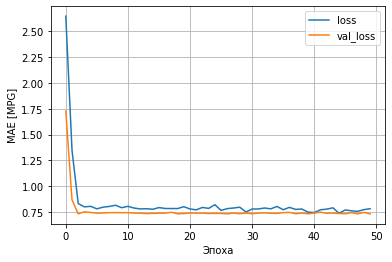

In [200]:
plot_loss(history)

9/9 [==============================] - 0s 3ms/step


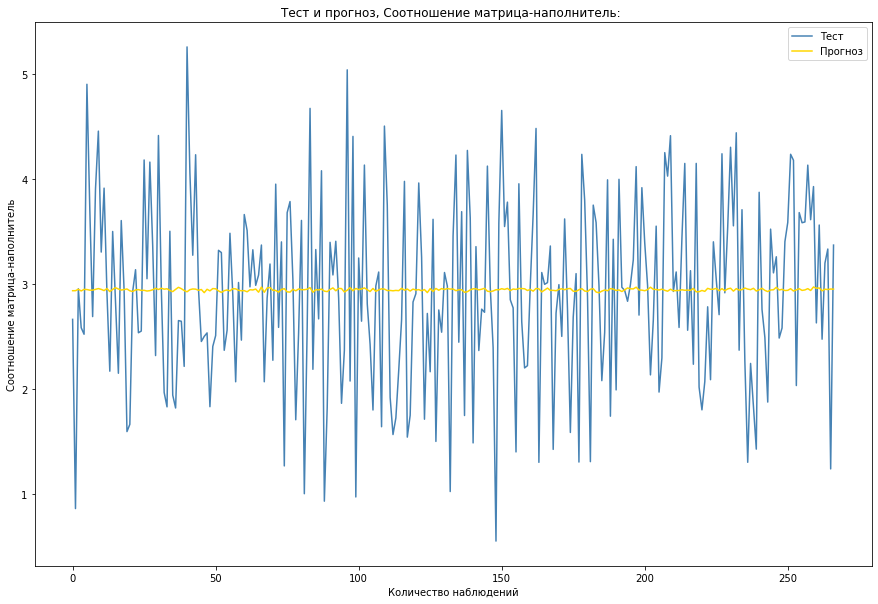

In [189]:
predicted_ns(y_nn_test, model_22.predict(x_nn_test))

In [190]:
# Оценка модели
MSE = mean_squared_error(y_nn_test, model_22.predict(x_nn_test))
R2 = r2_score(y_nn_test, model_22.predict(x_nn_test))

print(f'MSE NN = {MSE}')
print(f'R2_score NN = {R2}')

9/9 [==============================] - 0s 2ms/step
MSE NN = 0.7786241134810251
R2_score NN = -0.0007052383060675016


Модель 6

In [201]:
model_22 = keras.Sequential()

# Входной Dense слой с кол-вом нейронов = 50, входная размерность = кол-ву факторных переменных
model_22.add(Dense(50, input_dim = x_nn_train.shape[1], activation = 'sigmoid'))
# слой Dropout для избежания переобучения (от 10 до 50%)
model_22.add(Dropout(0.15))

# Dense слой с кол-вом нейронов = 128, Dropout слой
model_22.add(Dense(128, activation = 'sigmoid'))
model_22.add(Dropout(0.15))

# Dense слой с кол-вом нейронов = 64, Dropout слой
model_22.add(Dense(64, activation = 'sigmoid'))
model_22.add(Dropout(0.15))

# Dense слой с кол-вом нейронов = 32, Dropout слой
model_22.add(Dense(32, activation = 'sigmoid'))
model_22.add(Dropout(0.15))

# Выходной слой
model_22.add(Dense(1))

model_22.summary()

Model: "sequential_7"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 dense_33 (Dense)            (None, 50)                550       
                                                                 
 dropout_26 (Dropout)        (None, 50)                0         
                                                                 
 dense_34 (Dense)            (None, 128)               6528      
                                                                 
 dropout_27 (Dropout)        (None, 128)               0         
                                                                 
 dense_35 (Dense)            (None, 64)                8256      
                                                                 
 dropout_28 (Dropout)        (None, 64)                0         
                                                                 
 dense_36 (Dense)            (None, 32)               

In [192]:
# Конфигурация обучения (оптимизатор, функция потерь, метрики)
model_22.compile(optimizer='adam', loss='mae', metrics=['mae', 'mse'])

# Обучаем модель на тестовых данных
history = model_22.fit(
    x_nn_train, y_nn_train,
    validation_split = 0.2,
    verbose=1, epochs = 50)

Epoch 1/50
16/16 [==============================] - 2s 18ms/step - loss: 2.6475 - mae: 2.6475 - mse: 8.0484 - val_loss: 1.7277 - val_mae: 1.7277 - val_mse: 3.8144
Epoch 2/50
16/16 [==============================] - 0s 5ms/step - loss: 1.3477 - mae: 1.3477 - mse: 2.5697 - val_loss: 0.8677 - val_mae: 0.8677 - val_mse: 1.1935
Epoch 3/50
16/16 [==============================] - 0s 6ms/step - loss: 0.8311 - mae: 0.8311 - mse: 1.1203 - val_loss: 0.7307 - val_mae: 0.7307 - val_mse: 0.8558
Epoch 4/50
16/16 [==============================] - 0s 7ms/step - loss: 0.7987 - mae: 0.7987 - mse: 0.9881 - val_loss: 0.7505 - val_mae: 0.7505 - val_mse: 0.8789
Epoch 5/50
16/16 [==============================] - 0s 6ms/step - loss: 0.8039 - mae: 0.8039 - mse: 0.9855 - val_loss: 0.7445 - val_mae: 0.7445 - val_mse: 0.8687
Epoch 6/50
16/16 [==============================] - 0s 7ms/step - loss: 0.7796 - mae: 0.7796 - mse: 0.9398 - val_loss: 0.7374 - val_mae: 0.7374 - val_mse: 0.8603
Epoch 7/50
16/16 [=========

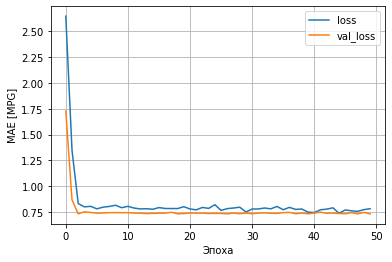

In [202]:
plot_loss(history)

9/9 [==============================] - 0s 2ms/step


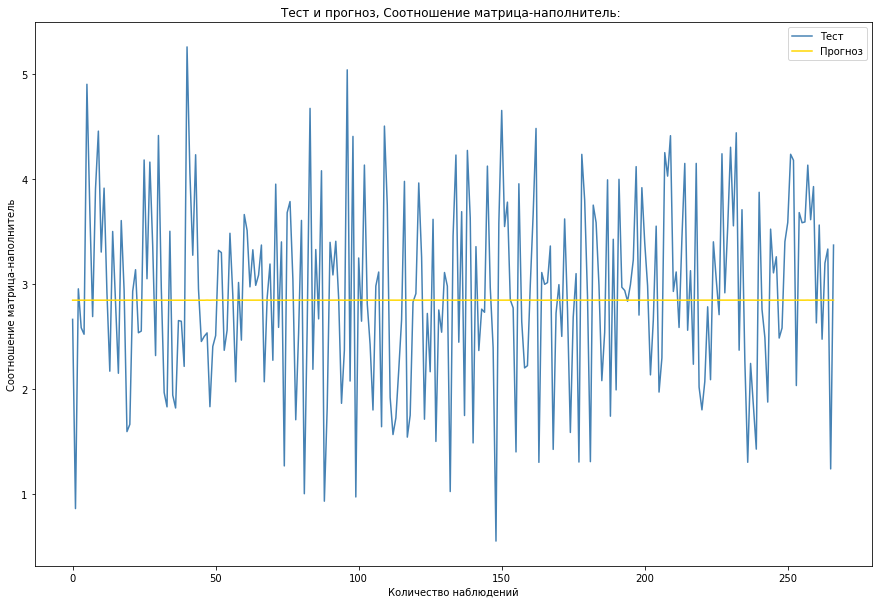

In [194]:
predicted_ns(y_nn_test, model_22.predict(x_nn_test))

In [195]:
# Оценка модели
MSE = mean_squared_error(y_nn_test, model_22.predict(x_nn_test))
R2 = r2_score(y_nn_test, model_22.predict(x_nn_test))

print(f'MSE NN = {MSE}')
print(f'R2_score NN = {R2}')

9/9 [==============================] - 0s 2ms/step
MSE NN = 0.7835878289100824
R2_score NN = -0.007084717114026695
